In [11]:
import pandas as pd
data = pd.read_csv("/content/drive/MyDrive/MLNBD/ML_Neuro/data.csv")

<ipython-input-11-21df5093910f>:2: DtypeWarning: Columns (0,1,2,3,4,5,6,7) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv("/content/drive/MyDrive/MLNBD/ML_Neuro/data.csv")


In [12]:
data.columns

Index(['cursor_pos', 'cursor_pos.1', 'eye_pos', 'eye_pos.1', 'hand_pos',
       'hand_pos.1', 'hand_vel', 'hand_vel.1', 'spikes', 'spikes.1',
       ...
       'spikes.132', 'spikes.133', 'spikes.134', 'spikes.135', 'spikes.136',
       'spikes.137', 'spikes.138', 'spikes.139', 'spikes.140', 'spikes.141'],
      dtype='object', length=150)

In [13]:
!pip install filterpy
  # Install scikit-learn to install datasets as dependencies
!pip install pynwb
!pip install hmmlearn

In [ ]:
from pynwb import NWBHDF5IO

# Load NWB file
io = NWBHDF5IO('/content/drive/MyDrive/MLNBD/ML_Neuro/Original_Data/sub-Jenkins_ses-small_desc-train_behavior+ecephys.nwb', 'r')
nwbfile = io.read()


/usr/local/lib/python3.10/dist-packages/hdmf/spec/namespace.py:535: UserWarning: Ignoring cached namespace 'hdmf-common' version 1.5.0 because version 1.8.0 is already loaded.
  warn("Ignoring cached namespace '%s' version %s because version %s is already loaded."
/usr/local/lib/python3.10/dist-packages/hdmf/spec/namespace.py:535: UserWarning: Ignoring cached namespace 'core' version 2.4.0 because version 2.7.0 is already loaded.
  warn("Ignoring cached namespace '%s' version %s because version %s is already loaded."
/usr/local/lib/python3.10/dist-packages/hdmf/spec/namespace.py:535: UserWarning: Ignoring cached namespace 'hdmf-experimental' version 0.1.0 because version 0.5.0 is already loaded.
  warn("Ignoring cached namespace '%s' version %s because version %s is already loaded."


In [ ]:

# Access behavior data
hand_pos = nwbfile.processing['behavior'].data_interfaces['hand_pos']
hand_vel = nwbfile.processing['behavior'].data_interfaces['hand_vel']
eye_pos = nwbfile.processing['behavior'].data_interfaces['eye_pos']
cursor_pos = nwbfile.processing['behavior'].data_interfaces['cursor_pos']
trials = nwbfile.intervals['trials']



In [ ]:
type(trials["trial_type"][0])

numpy.int64

In [ ]:
import numpy as np

trial_data = []
for trial_idx in range(len(trials)):
    # Extract trial-specific information
    trial_type = int(trials['trial_type'][trial_idx])
    start_time = trials['start_time'][trial_idx]
    stop_time = trials['stop_time'][trial_idx]
    target_pos = trials['target_pos'][trial_idx]
    barrier_pos = trials['barrier_pos'][trial_idx]

    # Filter data for this trial interval
    trial_hand_pos = hand_pos.data[np.logical_and(
        hand_pos.timestamps >= start_time,
        hand_pos.timestamps <= stop_time
    )]
    trial_hand_vel = hand_vel.data[np.logical_and(
        hand_vel.timestamps >= start_time,
        hand_vel.timestamps <= stop_time
    )]
    trial_eye_pos = eye_pos.data[np.logical_and(
        eye_pos.timestamps >= start_time,
        eye_pos.timestamps <= stop_time
    )]
    trial_cursor_pos = cursor_pos.data[np.logical_and(
        cursor_pos.timestamps >= start_time,
        cursor_pos.timestamps <= stop_time
    )]

    # Ensure target_pos and barrier_pos are extracted properly
    trial_target_pos = np.array(target_pos)  # target_pos should already match trial indices
    trial_barrier_pos = np.array(barrier_pos)  # barrier_pos should already match trial indices

    # Handle missing data or empty arrays
    trial_hand_pos = trial_hand_pos.tolist() if trial_hand_pos.size > 0 else []
    trial_hand_vel = trial_hand_vel.tolist() if trial_hand_vel.size > 0 else []
    trial_eye_pos = trial_eye_pos.tolist() if trial_eye_pos.size > 0 else []
    trial_cursor_pos = trial_cursor_pos.tolist() if trial_cursor_pos.size > 0 else []

    # Store trial data
    trial_data.append({
        "trial_id": trial_idx,
        "start_time": start_time,
        "stop_time": stop_time,
        "hand_pos": trial_hand_pos,
        "hand_vel": trial_hand_vel,
        "eye_pos": trial_eye_pos,
        "cursor_pos": trial_cursor_pos,
        "target_pos": trial_target_pos.tolist(),
        "barrier_pos": trial_barrier_pos.tolist(),
        "trial_type": trial_type
    })

# Inspect trial data (optional)
print(f"Processed {len(trial_data)} trials.")
print("Example Trial Data:", trial_data[0])


Processed 100 trials.
Example Trial Data: {'trial_id': 0, 'start_time': 0.0, 'stop_time': 3.421, 'hand_pos': [[-4.069391463135143, -31.888892887357343], [-4.066940743020508, -31.90072273920979], [-4.064521096636136, -31.912980443054277], [-4.062168204665466, -31.92550113590004], [-4.059822094964986, -31.93811222659131], [-4.0575018514898025, -31.950827609315958], [-4.055336235211395, -31.963551494181534], [-4.053194103875741, -31.976226125096254], [-4.051181679682036, -31.98881230124836], [-4.049442752983631, -32.001309261157814], [-4.047961747944242, -32.01360252720889], [-4.046694205371443, -32.025667403302066], [-4.045650269799997, -32.037435315863426], [-4.044949639691285, -32.048996963288324], [-4.044444994545661, -32.06038109964912], [-4.044221847442087, -32.071510263127536], [-4.044360219183204, -32.08239796878024], [-4.044796222150323, -32.09320891472272], [-4.045825880771241, -32.10392623957359], [-4.047124621023265, -32.11453707021373], [-4.048655874392575, -32.12509484159441

In [ ]:
trial_data[2]["trial_type"]

4

In [ ]:
units = nwbfile.units  # Access the units table
spike_times = units['spike_times']  # Spike times for each unit
obs_intervals = units['obs_intervals']  # Observation intervals for each unit


In [ ]:
trial_spike_data = []

for trial_idx in range(len(trials)):
    # Get trial start/stop time
    start_time = trials['start_time'][trial_idx]
    stop_time = trials['stop_time'][trial_idx]

    # Filter spike times for this trial
    trial_spikes = []
    for unit_idx in range(len(units)):
        # Get spike times for this unit
        unit_spike_times = spike_times[unit_idx]

        # Filter spike times within the trial interval
        trial_unit_spikes = unit_spike_times[
            (unit_spike_times >= start_time) & (unit_spike_times <= stop_time)
        ]

        # Append the unit-specific spikes for this trial
        trial_spikes.append(trial_unit_spikes.tolist())

    # Store trial-level spike data
    trial_spike_data.append({
        "trial_id": trial_idx,
        "start_time": start_time,
        "stop_time": stop_time,
        "spike_data": trial_spikes  # List of spike times for all units
    })


In [ ]:
import json
for i, trial in enumerate(trial_data):
    trial['spike_data'] = trial_spike_data[i]['spike_data']

# # Save combined data
# with open('/content/drive/MyDrive/MLNBD/ML_Neuro/DATA ANALYTICS/trajectory_with_spike_data.json', 'w') as f:
#     json.dump(trial_data, f)


In [ ]:
import json
with open("/content/drive/MyDrive/MLNBD/ML_Neuro/DATA ANALYTICS/trajectory_with_spike_data.json", "r") as f:
    trial_data = json.load(f)
with open("output.txt", "w") as file:
    # Redirect the print output to the file
    print(trial_data[0], file=file)

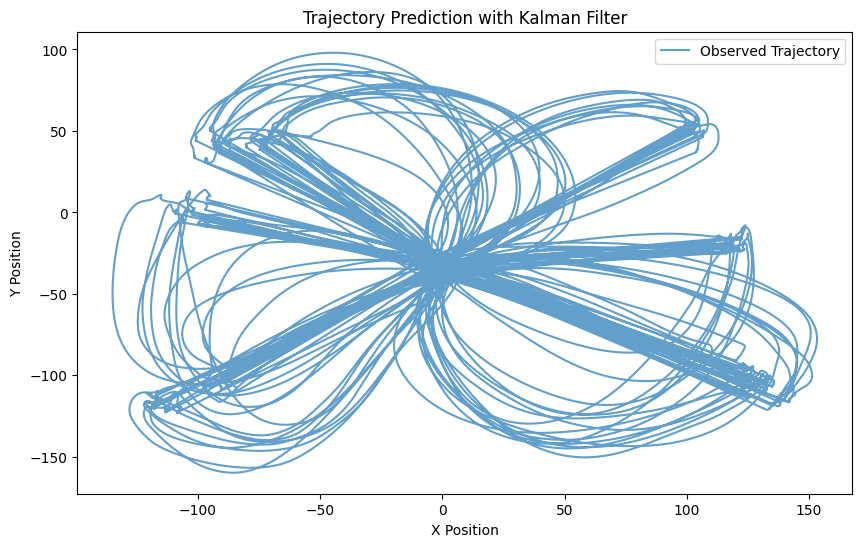

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from filterpy.kalman import KalmanFilter

# Preprocess data: Extract hand positions from unfiltered data
def preprocess_hand_pos(unfiltered_data):
    # Extract observations (e.g., hand_pos from trials)
    observations = []
    for trial in unfiltered_data:
        hand_pos = np.array(trial.get("hand_pos", []))  # Extract hand positions
        if hand_pos.shape[0] > 0:  # Skip trials with no data
            observations.append(hand_pos)
    return np.concatenate(observations, axis=0)  # Combine all trials into one array

# Load unfiltered data (replace with your actual JSON file path)
import json
with open("/content/drive/MyDrive/MLNBD/ML_Neuro/DATA ANALYTICS/trajectory_with_spike_data.json", "r") as f:
    unfiltered_data = json.load(f)

# Extract hand positions
observations = preprocess_hand_pos(unfiltered_data)

# Initialize Kalman Filter
kf = KalmanFilter(dim_x=2, dim_z=2)  # State and observation dimensions (e.g., x, y)

# Define Kalman Filter matrices
kf.F = np.eye(2)  # Transition matrix
kf.H = np.eye(2)  # Observation matrix
kf.P = np.eye(2) * 500  # Covariance matrix
kf.R = np.eye(2) * 5    # Measurement noise
kf.Q = np.eye(2) * 0.1  # Process noise

# Initial state
kf.x = np.zeros(2)

# Apply the filter to smooth data
smoothed_states = []
for obs in observations:
    kf.predict()
    kf.update(obs)
    smoothed_states.append(kf.x.copy())

smoothed_states = np.array(smoothed_states)

# Predict future states
future_steps = 50
predicted_states = []
current_state = kf.x.copy()

for _ in range(future_steps):
    kf.predict()
    predicted_states.append(kf.x.copy())

predicted_states = np.array(predicted_states)

# Plot results
plt.figure(figsize=(10, 6))
plt.plot(observations[:, 0], observations[:, 1], label="Observed Trajectory", alpha=0.7)
# plt.plot(smoothed_states[:, 0], smoothed_states[:, 1], label="Smoothed Trajectory", alpha=0.7)
# plt.plot(predicted_states[:, 0], predicted_states[:, 1], label="Predicted Trajectory", linestyle="--")
plt.legend()
plt.xlabel("X Position")
plt.ylabel("Y Position")
plt.title("Trajectory Prediction with Kalman Filter")
plt.show()


Mean Squared Error on Test Set: 7264.5929


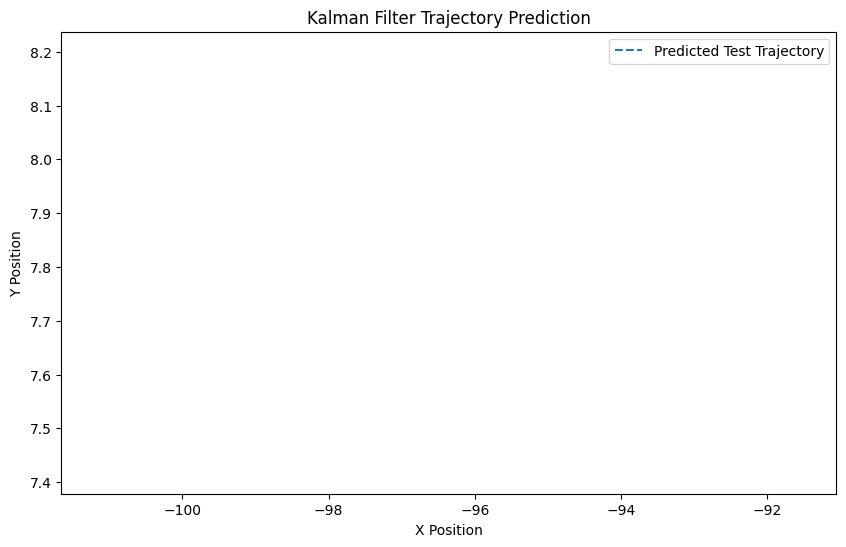

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from filterpy.kalman import KalmanFilter
from sklearn.metrics import mean_squared_error

# Function to group data by trial IDs and times
def group_data_by_trials(unfiltered_data):
    trials = []
    for trial in unfiltered_data:
        trial_id = trial.get("trial_id", None)  # Extract trial ID
        start_time = trial.get("start_time", None)  # Extract start time
        hand_pos = np.array(trial.get("hand_pos", []))  # Extract hand positions

        if trial_id is not None and start_time is not None and hand_pos.shape[0] > 0:
            trials.append({
                "trial_id": trial_id,
                "start_time": start_time,
                "hand_pos": hand_pos
            })
    return sorted(trials, key=lambda x: x["start_time"])  # Sort by start time

# Load unfiltered data (replace with your actual JSON file path)
import json
with open("/content/drive/MyDrive/MLNBD/ML_Neuro/DATA ANALYTICS/trajectory_with_spike_data.json", "r") as f:
    unfiltered_data = json.load(f)

# Group and sort trials by time
trials = group_data_by_trials(unfiltered_data)

# Split into train and test sets based on trial count
split_ratio = 0.8
split_idx = int(len(trials) * split_ratio)

train_trials = trials[:split_idx]
test_trials = trials[split_idx:]

# Combine data from train and test trials
train_data = np.concatenate([trial["hand_pos"] for trial in train_trials], axis=0)
test_data = np.concatenate([trial["hand_pos"] for trial in test_trials], axis=0)

# Initialize Kalman Filter
kf = KalmanFilter(dim_x=2, dim_z=2)  # State and observation dimensions (e.g., x, y)

# Define Kalman Filter matrices
kf.F = np.eye(2)  # Transition matrix
kf.H = np.eye(2)  # Observation matrix
kf.P = np.eye(2) * 500  # Covariance matrix
kf.R = np.eye(2) * 5    # Measurement noise
kf.Q = np.eye(2) * 0.1  # Process noise

# Initial state
kf.x = np.zeros(2)

# Train on the training set
smoothed_train_states = []
for obs in train_data:
    kf.predict()
    kf.update(obs)
    smoothed_train_states.append(kf.x.copy())

# Validate on the test set
predicted_test_states = []
for obs in test_data:
    kf.predict()
    predicted_test_states.append(kf.x.copy())  # Predict without updating

predicted_test_states = np.array(predicted_test_states)

# Compute error metrics
mse = mean_squared_error(test_data, predicted_test_states)
print(f"Mean Squared Error on Test Set: {mse:.4f}")

# Plot results
plt.figure(figsize=(10, 6))
# plt.plot(train_data[:, 0], train_data[:, 1], label="Training Data", alpha=0.7)
# plt.plot(test_data[:, 0], test_data[:, 1], label="Test Data", alpha=0.7)
plt.plot(predicted_test_states[:, 0], predicted_test_states[:, 1], label="Predicted Test Trajectory", linestyle="--")
plt.legend()
plt.xlabel("X Position")
plt.ylabel("Y Position")
plt.title("Kalman Filter Trajectory Prediction")
plt.show()


In [ ]:
print("Train Data Shape:", train_data.shape)
print("Test Data Shape:", test_data.shape)
print("First Train Observation:", train_data[0])
print("First Test Observation:", test_data[0])


Train Data Shape: (229420, 2)
Test Data Shape: (58290, 2)
First Train Observation: [ -4.06939146 -31.88889289]
First Test Observation: [  0.96226634 -27.8929647 ]


Train Data Shape: (229420, 2)
Test Data Shape: (58290, 2)
First Predicted State: [-96.35368629   7.80783844]
Mean Squared Error on Test Set: 7264.5929


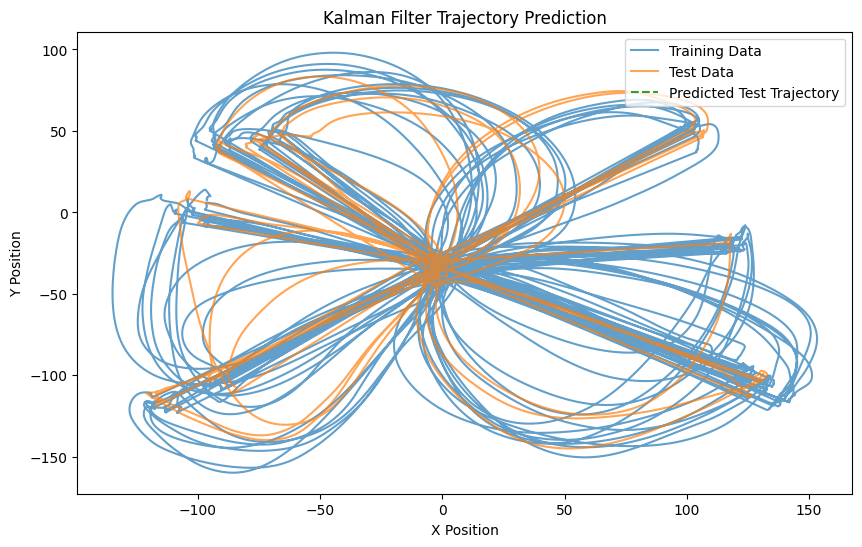

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from filterpy.kalman import KalmanFilter
from sklearn.metrics import mean_squared_error

# Function to group data by trial IDs and times
def group_data_by_trials(unfiltered_data):
    trials = []
    for trial in unfiltered_data:
        trial_id = trial.get("trial_id", None)  # Extract trial ID
        start_time = trial.get("start_time", None)  # Extract start time
        hand_pos = np.array(trial.get("hand_pos", []))  # Extract hand positions

        if trial_id is not None and start_time is not None and hand_pos.shape[0] > 0:
            trials.append({
                "trial_id": trial_id,
                "start_time": start_time,
                "hand_pos": hand_pos
            })
    return sorted(trials, key=lambda x: x["start_time"])  # Sort by start time

# Load unfiltered data (replace with your actual JSON file path)
import json
with open("/content/drive/MyDrive/MLNBD/ML_Neuro/DATA ANALYTICS/trajectory_with_spike_data.json", "r") as f:
    unfiltered_data = json.load(f)

# Group and sort trials by time
trials = group_data_by_trials(unfiltered_data)

# Split into train and test sets based on trial count
split_ratio = 0.8
split_idx = int(len(trials) * split_ratio)

train_trials = trials[:split_idx]
test_trials = trials[split_idx:]

# Combine data from train and test trials
train_data = np.concatenate([trial["hand_pos"] for trial in train_trials], axis=0)
test_data = np.concatenate([trial["hand_pos"] for trial in test_trials], axis=0)

# Debug: Verify train and test data
print("Train Data Shape:", train_data.shape)
print("Test Data Shape:", test_data.shape)

# Initialize Kalman Filter
kf = KalmanFilter(dim_x=2, dim_z=2)  # State and observation dimensions (e.g., x, y)

# Define Kalman Filter matrices
kf.F = np.eye(2)  # Transition matrix
kf.H = np.eye(2)  # Observation matrix
kf.P = np.eye(2) * 500  # Covariance matrix
kf.R = np.eye(2) * 5    # Measurement noise
kf.Q = np.eye(2) * 0.1  # Process noise
kf.x = train_data[0]    # Initialize state with the first observation

# Train on the training set
smoothed_train_states = []
for obs in train_data:
    kf.predict()
    kf.update(obs)
    smoothed_train_states.append(kf.x.copy())

# Validate on the test set
predicted_test_states = []
for obs in test_data:
    kf.predict()
    predicted_test_states.append(kf.x.copy())  # Predict without updating

predicted_test_states = np.array(predicted_test_states)

# Debug: Check predicted states
if len(predicted_test_states) > 0:
    print("First Predicted State:", predicted_test_states[0])
else:
    print("No Predicted States")

# Compute error metrics
if len(predicted_test_states) == len(test_data):
    mse = mean_squared_error(test_data, predicted_test_states)
    print(f"Mean Squared Error on Test Set: {mse:.4f}")
else:
    print("Mismatch in predicted and actual test data length")

# Plot results
plt.figure(figsize=(10, 6))
plt.plot(train_data[:, 0], train_data[:, 1], label="Training Data", alpha=0.7)
plt.plot(test_data[:, 0], test_data[:, 1], label="Test Data", alpha=0.7)
plt.plot(predicted_test_states[:, 0], predicted_test_states[:, 1], label="Predicted Test Trajectory", linestyle="--")
plt.legend()
plt.xlabel("X Position")
plt.ylabel("Y Position")
plt.title("Kalman Filter Trajectory Prediction")
plt.show()


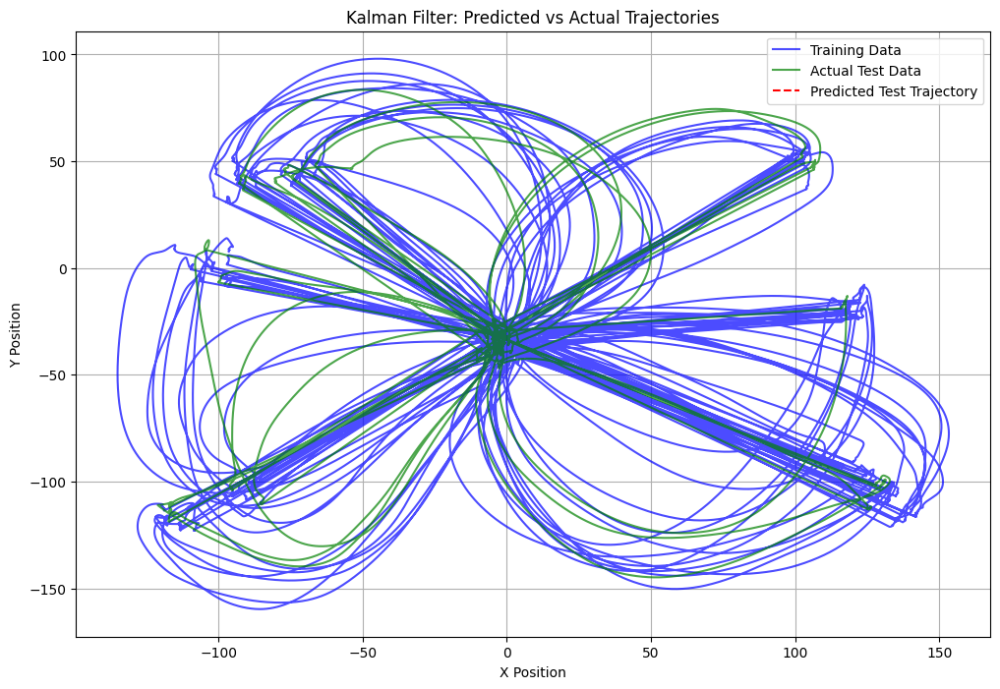

In [ ]:
# Plot results
plt.figure(figsize=(12, 8))

# Plot the training trajectory
plt.plot(train_data[:, 0], train_data[:, 1], label="Training Data", alpha=0.7, color="blue")

# Plot the actual test trajectory
plt.plot(test_data[:, 0], test_data[:, 1], label="Actual Test Data", alpha=0.7, color="green")

# Plot the predicted test trajectory
if len(predicted_test_states) > 0:
    plt.plot(predicted_test_states[:, 0], predicted_test_states[:, 1], label="Predicted Test Trajectory", linestyle="--", color="red")
else:
    print("No predicted states available for plotting.")

# Add labels, legend, and title
plt.xlabel("X Position")
plt.ylabel("Y Position")
plt.title("Kalman Filter: Predicted vs Actual Trajectories")
plt.legend()
plt.grid(True)

# Show the plot
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from filterpy.kalman import KalmanFilter
from sklearn.metrics import mean_squared_error
import json

# Load the JSON file (replace with the actual file path)
with open("/content/drive/MyDrive/MLNBD/ML_Neuro/DATA ANALYTICS/trajectory_with_spike_data.json", "r") as f:
    data = json.load(f)

# Extract spike data and trajectory (hand_pos) from the JSON
def preprocess_data(data, max_length=None):
    spike_data = []
    trajectory_data = []

    # Determine maximum sequence length if not provided
    if max_length is None:
        max_length = max((len(trial.get("spike_data", [])) for trial in data), default=0)

    for trial_idx, trial in enumerate(data):
        if "spike_data" not in trial or "hand_pos" not in trial:
            print(f"Skipping trial {trial_idx}: Missing 'spike_data' or 'hand_pos'")
            continue

        spikes = trial["spike_data"]
        hand_pos = trial["hand_pos"]

        if not isinstance(spikes, list) or not isinstance(hand_pos, list):
            print(f"Skipping trial {trial_idx}: Invalid data types (spike_data: {type(spikes)}, hand_pos: {type(hand_pos)})")
            continue

        spikes = np.array(spikes, dtype=object)
        hand_pos = np.array(hand_pos, dtype=object)

        if len(spikes) != len(hand_pos):
            print(f"Skipping trial {trial_idx}: Length mismatch (spikes: {len(spikes)}, hand_pos: {len(hand_pos)})")
            continue

        # Pad or truncate to the maximum length
        padded_spikes = np.zeros((max_length, spikes.shape[1]))
        padded_spikes[:len(spikes), :] = spikes

        padded_hand_pos = np.zeros((max_length, hand_pos.shape[1]))
        padded_hand_pos[:len(hand_pos), :] = hand_pos

        spike_data.append(padded_spikes)
        trajectory_data.append(padded_hand_pos)

    # Check if any valid trials were processed
    if not spike_data or not trajectory_data:
        raise ValueError("No valid trials found. Check your data structure.")

    # Concatenate all trials into one array
    return np.concatenate(spike_data, axis=0), np.concatenate(trajectory_data, axis=0)





# Preprocess data
spike_data, trajectory_data = preprocess_data(data)

# Split data into train and test sets (80-20 split)
split_ratio = 0.8
split_idx = int(len(spike_data) * split_ratio)

spike_train = spike_data[:split_idx]
trajectory_train = trajectory_data[:split_idx]
spike_test = spike_data[split_idx:]
trajectory_test = trajectory_data[split_idx:]

# Initialize Kalman Filter
kf = KalmanFilter(dim_x=spike_train.shape[1] + 2, dim_z=2)  # Include spikes and trajectory states

# Define Kalman Filter matrices
kf.F = np.eye(spike_train.shape[1] + 2)  # Transition matrix
kf.H = np.zeros((2, spike_train.shape[1] + 2))  # Observation matrix
kf.H[:, -2:] = np.eye(2)  # Map trajectory state to observed data
kf.P = np.eye(spike_train.shape[1] + 2) * 500  # Covariance matrix
kf.R = np.eye(2) * 5    # Measurement noise
kf.Q = np.eye(spike_train.shape[1] + 2) * 0.1  # Process noise
kf.x = np.zeros(spike_train.shape[1] + 2)  # Initial state

# Train on the training set
smoothed_train_states = []
for i in range(len(spike_train)):
    kf.predict()
    combined_input = np.hstack([spike_train[i], trajectory_train[i]])  # Combine spike and trajectory
    kf.update(combined_input)
    smoothed_train_states.append(kf.x.copy())

# Validate on the test set
predicted_test_states = []
for i in range(len(spike_test)):
    kf.predict()
    predicted_state = kf.x[-2:]  # Extract trajectory predictions
    predicted_test_states.append(predicted_state)

predicted_test_states = np.array(predicted_test_states)

# Compute error metrics
mse = mean_squared_error(trajectory_test, predicted_test_states)
print(f"Mean Squared Error on Test Set: {mse:.4f}")

# Plot results
plt.figure(figsize=(12, 8))
plt.plot(trajectory_train[:, 0], trajectory_train[:, 1], label="Training Trajectory", alpha=0.7, color="blue")
plt.plot(trajectory_test[:, 0], trajectory_test[:, 1], label="Actual Test Trajectory", alpha=0.7, color="green")
plt.plot(predicted_test_states[:, 0], predicted_test_states[:, 1], label="Predicted Test Trajectory", linestyle="--", color="red")
plt.legend()
plt.xlabel("X Position")
plt.ylabel("Y Position")
plt.title("Kalman Filter with Neural Data for Trajectory Prediction")
plt.grid(True)
plt.show()


**CORRECT FROM HERE**

In [14]:
import json
with open("/content/drive/MyDrive/MLNBD/ML_Neuro/DATA ANALYTICS/trajectory_with_spike_data.json", "r") as f:
    data = json.load(f)

In [15]:
bin_size = 0.05  # 50 ms

# Function to compute the number of bins for each trial
def compute_num_bins(trial, bin_size):
    return int((trial["stop_time"] - trial["start_time"]) / bin_size)

# Compute the number of bins for each trial
trial_bins = [compute_num_bins(trial, bin_size) for trial in data]

# Check if all trials have the same number of bins
unique_bins = set(trial_bins)
unique_bins_count = len(unique_bins)

unique_bins, unique_bins_count

({41,
  42,
  43,
  44,
  45,
  46,
  47,
  49,
  50,
  51,
  52,
  53,
  54,
  55,
  56,
  57,
  58,
  59,
  60,
  61,
  62,
  63,
  64,
  65,
  66,
  67,
  68,
  70,
  71},
 29)

In [ ]:
# import numpy as np
# from filterpy.kalman import KalmanFilter
# import matplotlib.pyplot as plt

# # Example of parsing one dictionary from your data
# # Assuming `data` is a list of dictionaries from your dataset


# # Extracting relevant fields
# hand_positions = np.array(data[0]["hand_pos"])  # Shape (T, 2) where T is the number of time steps
# spike_data = np.array(data[0]["spike_data"])    # Shape (T, N) where N is the number of neurons

# # Kalman Filter Initialization
# kf = KalmanFilter(dim_x=4, dim_z=2)  # 4 state variables (x, y, vx, vy), 2 measurements (x, y)

# # State Transition Matrix (F)
# kf.F = np.array([
#     [1, 0, 1, 0],  # x_t = x_(t-1) + vx_(t-1)
#     [0, 1, 0, 1],  # y_t = y_(t-1) + vy_(t-1)
#     [0, 0, 1, 0],  # vx_t = vx_(t-1)
#     [0, 0, 0, 1],  # vy_t = vy_(t-1)
# ])

# # Measurement Function (H)
# kf.H = np.array([
#     [1, 0, 0, 0],  # Measure x
#     [0, 1, 0, 0],  # Measure y
# ])

# # Covariance Matrix (P)
# kf.P = np.eye(4) * 1000  # High initial uncertainty

# # Process Noise (Q)
# kf.Q = np.eye(4) * 0.1  # Small process noise

# # Measurement Noise (R)
# kf.R = np.eye(2) * 10  # Measurement noise

# # Initial State (x)
# kf.x = np.array([hand_positions[0, 0], hand_positions[0, 1], 0, 0])  # Start with initial position and zero velocity

# # Running the Kalman Filter
# filtered_positions = []
# for position in hand_positions:
#     kf.predict()
#     kf.update(position)  # Use hand position as measurement
#     filtered_positions.append(kf.x[:2])  # Append only x, y positions

# filtered_positions = np.array(filtered_positions)

# # Plot Results
# plt.figure(figsize=(10, 6))
# plt.plot(hand_positions[:, 0], hand_positions[:, 1], label="True Trajectory", linestyle="--", alpha=0.7)
# plt.plot(filtered_positions[:, 0], filtered_positions[:, 1], label="Kalman Filtered Trajectory", linewidth=2)
# plt.legend()
# plt.xlabel("X Position")
# plt.ylabel("Y Position")
# plt.title("Trajectory Prediction with Kalman Filter")
# plt.show()


ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (142,) + inhomogeneous part.

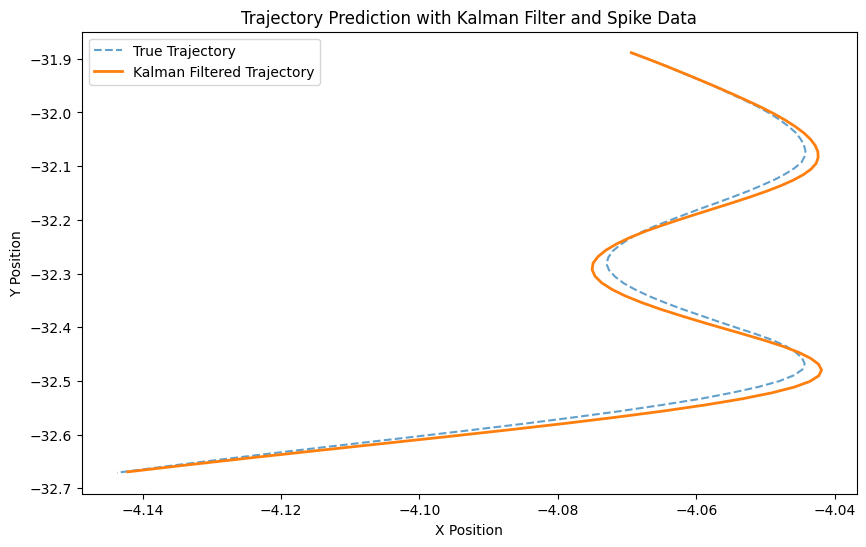

In [ ]:
import numpy as np
from filterpy.kalman import KalmanFilter
import matplotlib.pyplot as plt



# Extracting relevant fields
hand_positions = np.array(data[0]["hand_pos"])  # Shape (T, 2)
spike_data = data[0]["spike_data"]             # List of 142 lists of spike times

# Parameters for discretization
bin_size = 0.05  # Time bin size (e.g., 50ms)
num_bins = int((data[0]["stop_time"] - data[0]["start_time"]) / bin_size)

# Preprocess spike data into fixed bins
spike_features = np.zeros((len(spike_data), num_bins))  # Shape (142 neurons, num_bins)
for neuron_idx, spikes in enumerate(spike_data):
    # Histogram the spike times for each neuron
    binned_spikes, _ = np.histogram(spikes, bins=np.linspace(0, data[0]["stop_time"], num_bins + 1))
    spike_features[neuron_idx, :] = binned_spikes

# Combine spike features across neurons into one feature per bin
spike_summary = np.sum(spike_features, axis=0)  # Shape (num_bins,)

# Align hand positions to the number of bins
hand_positions = hand_positions[:num_bins]

# Kalman Filter Initialization
kf = KalmanFilter(dim_x=4, dim_z=2)  # 4 state variables (x, y, vx, vy), 2 measurements (x, y)

# State Transition Matrix (F)
kf.F = np.array([
    [1, 0, 1, 0],  # x_t = x_(t-1) + vx_(t-1)
    [0, 1, 0, 1],  # y_t = y_(t-1) + vy_(t-1)
    [0, 0, 1, 0],  # vx_t = vx_(t-1)
    [0, 0, 0, 1],  # vy_t = vy_(t-1)
])

# Measurement Function (H)
kf.H = np.array([
    [1, 0, 0, 0],  # Measure x
    [0, 1, 0, 0],  # Measure y
])

# Covariance Matrix (P)
kf.P = np.eye(4) * 1000  # High initial uncertainty

# Process Noise (Q)
kf.Q = np.eye(4) * 0.1  # Small process noise

# Measurement Noise (R)
kf.R = np.eye(2) * 10  # Measurement noise

# Initial State (x)
kf.x = np.array([hand_positions[0, 0], hand_positions[0, 1], 0, 0])  # Start with initial position and zero velocity

# Running the Kalman Filter
filtered_positions = []
for i, position in enumerate(hand_positions):
    kf.predict()
    kf.update(position)  # Use hand position as measurement
    filtered_positions.append(kf.x[:2])  # Append only x, y positions

filtered_positions = np.array(filtered_positions)

# Plot Results
plt.figure(figsize=(10, 6))
plt.plot(hand_positions[:, 0], hand_positions[:, 1], label="True Trajectory", linestyle="--", alpha=0.7)
plt.plot(filtered_positions[:, 0], filtered_positions[:, 1], label="Kalman Filtered Trajectory", linewidth=2)
plt.legend()
plt.xlabel("X Position")
plt.ylabel("Y Position")
plt.title("Trajectory Prediction with Kalman Filter and Spike Data")
plt.show()


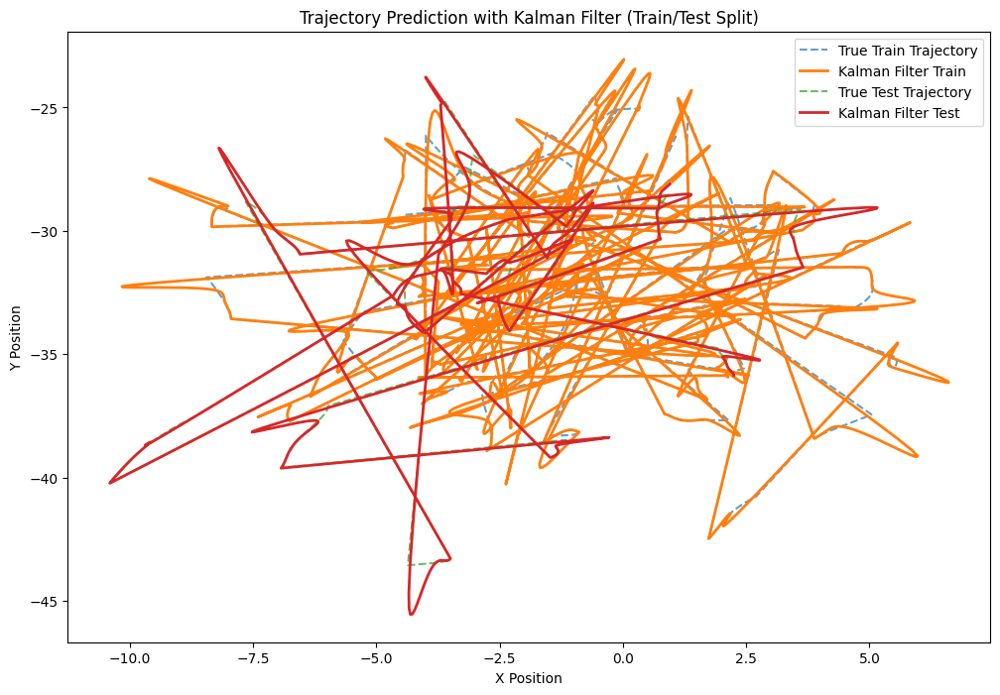

In [ ]:
import numpy as np
from filterpy.kalman import KalmanFilter
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# Example dataset with multiple trials
# Replace this with your actual data
# data = [
#     {
#         "trial_id": 0,
#         "start_time": 0.0,
#         "stop_time": 3.421,
#         "hand_pos": [[-4.06, -31.88], [-4.06, -31.90], ...],  # Truncated for example
#         "spike_data": [[0.01, 0.02, 0.1], [0.03, 0.07], ...],  # Truncated for example
#     },
#     # Additional trials...
# ]

# Parameters
bin_size = 0.05  # Time bin size (e.g., 50ms)

def preprocess_trial(trial):
    """Preprocess a single trial, binning spike data and aligning hand positions."""
    hand_positions = np.array(trial["hand_pos"])  # Shape (T, 2)
    spike_data = trial["spike_data"]              # List of lists with spike timestamps

    # Calculate the number of bins
    num_bins = int((trial["stop_time"] - trial["start_time"]) / bin_size)

    # Preprocess spike data into fixed bins
    spike_features = np.zeros((len(spike_data), num_bins))  # Shape (num_neurons, num_bins)
    for neuron_idx, spikes in enumerate(spike_data):
        binned_spikes, _ = np.histogram(spikes, bins=np.linspace(0, trial["stop_time"], num_bins + 1))
        spike_features[neuron_idx, :] = binned_spikes

    # Combine spike features across neurons
    spike_summary = np.sum(spike_features, axis=0)  # Shape (num_bins,)

    # Truncate hand positions to align with the number of bins
    hand_positions = hand_positions[:num_bins]

    return hand_positions, spike_summary

# Preprocess all trials
all_hand_positions = []
all_spike_summaries = []
all_times = []

for trial in data:
    hand_positions, spike_summary = preprocess_trial(trial)
    time_stamps = np.linspace(trial["start_time"], trial["stop_time"], len(hand_positions))

    all_hand_positions.append(hand_positions)
    all_spike_summaries.append(spike_summary)
    all_times.append(time_stamps)

# Combine all trials into single arrays
all_hand_positions = np.concatenate(all_hand_positions)
all_spike_summaries = np.concatenate(all_spike_summaries)
all_times = np.concatenate(all_times)

# Split data into training and testing based on time
train_indices = all_times < np.percentile(all_times, 80)  # 80% for training
test_indices = ~train_indices

train_positions = all_hand_positions[train_indices]
test_positions = all_hand_positions[test_indices]

train_spikes = all_spike_summaries[train_indices]
test_spikes = all_spike_summaries[test_indices]

# Kalman Filter Setup
kf = KalmanFilter(dim_x=4, dim_z=2)  # 4 state variables (x, y, vx, vy), 2 measurements (x, y)

kf.F = np.array([
    [1, 0, 1, 0],  # x_t = x_(t-1) + vx_(t-1)
    [0, 1, 0, 1],  # y_t = y_(t-1) + vy_(t-1)
    [0, 0, 1, 0],  # vx_t = vx_(t-1)
    [0, 0, 0, 1],  # vy_t = vy_(t-1)
])

kf.H = np.array([
    [1, 0, 0, 0],  # Measure x
    [0, 1, 0, 0],  # Measure y
])

kf.P = np.eye(4) * 1000
kf.Q = np.eye(4) * 0.1
kf.R = np.eye(2) * 10

kf.x = np.array([train_positions[0, 0], train_positions[0, 1], 0, 0])

# Apply Kalman Filter to Training Data
filtered_train_positions = []
for position in train_positions:
    kf.predict()
    kf.update(position)
    filtered_train_positions.append(kf.x[:2])
filtered_train_positions = np.array(filtered_train_positions)

# Predict on Test Data
filtered_test_positions = []
for position in test_positions:
    kf.predict()
    kf.update(position)
    filtered_test_positions.append(kf.x[:2])
filtered_test_positions = np.array(filtered_test_positions)

# Plot Results
plt.figure(figsize=(12, 8))
plt.plot(train_positions[:, 0], train_positions[:, 1], label="True Train Trajectory", linestyle="--", alpha=0.7)
plt.plot(filtered_train_positions[:, 0], filtered_train_positions[:, 1], label="Kalman Filter Train", linewidth=2)
plt.plot(test_positions[:, 0], test_positions[:, 1], label="True Test Trajectory", linestyle="--", alpha=0.7)
plt.plot(filtered_test_positions[:, 0], filtered_test_positions[:, 1], label="Kalman Filter Test", linewidth=2)
plt.legend()
plt.xlabel("X Position")
plt.ylabel("Y Position")
plt.title("Trajectory Prediction with Kalman Filter (Train/Test Split)")
plt.show()


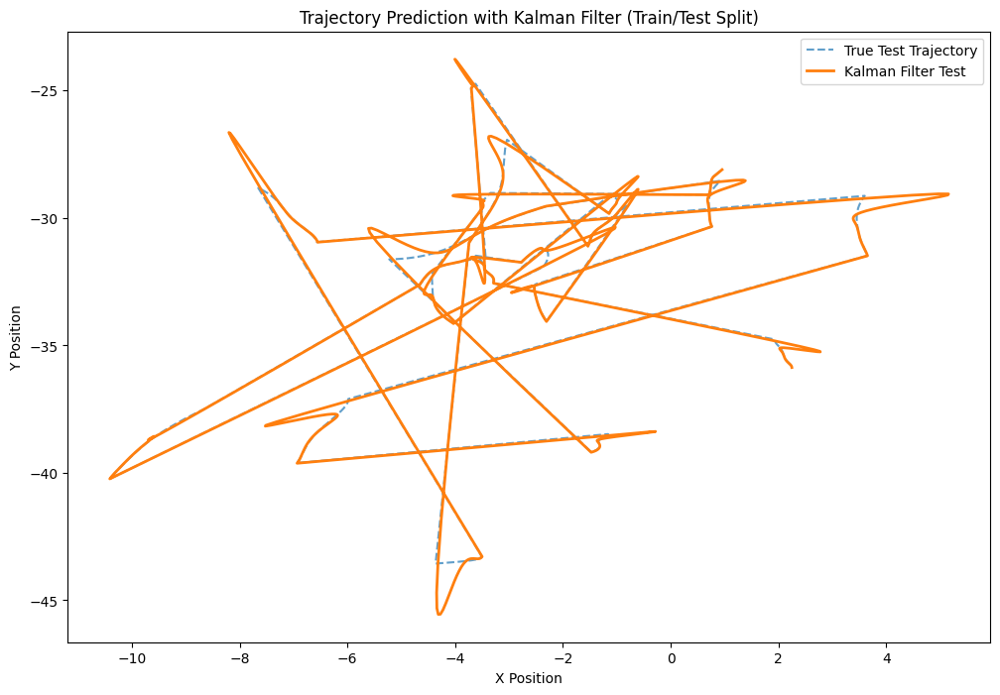

In [ ]:
plt.figure(figsize=(12, 8))
# plt.plot(train_positions[:, 0], train_positions[:, 1], label="True Train Trajectory", linestyle="--", alpha=0.7)
# plt.plot(filtered_train_positions[:, 0], filtered_train_positions[:, 1], label="Kalman Filter Train", linewidth=2)
plt.plot(test_positions[:, 0], test_positions[:, 1], label="True Test Trajectory", linestyle="--", alpha=0.7)
plt.plot(filtered_test_positions[:, 0], filtered_test_positions[:, 1], label="Kalman Filter Test", linewidth=2)
plt.legend()
plt.xlabel("X Position")
plt.ylabel("Y Position")
plt.title("Trajectory Prediction with Kalman Filter (Train/Test Split)")
plt.show()

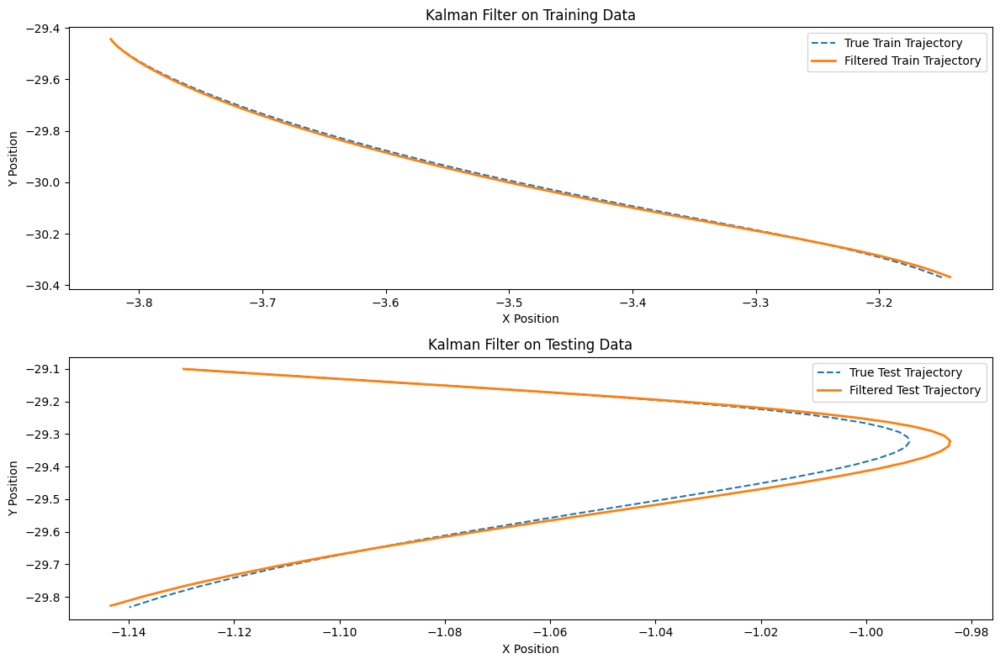

In [ ]:
import numpy as np
from filterpy.kalman import KalmanFilter
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# Example dataset with multiple trials
# Replace this with your actual data

# Parameters
bin_size = 0.05  # Time bin size (e.g., 50ms)

def preprocess_trial(trial):
    """Preprocess a single trial, binning spike data and aligning hand positions."""
    hand_positions = np.array(trial["hand_pos"])  # Shape (T, 2)
    spike_data = trial["spike_data"]              # List of lists with spike timestamps

    # Calculate the number of bins
    num_bins = int((trial["stop_time"] - trial["start_time"]) / bin_size)

    # Preprocess spike data into fixed bins
    spike_features = np.zeros((len(spike_data), num_bins))  # Shape (num_neurons, num_bins)
    for neuron_idx, spikes in enumerate(spike_data):
        binned_spikes, _ = np.histogram(spikes, bins=np.linspace(0, trial["stop_time"], num_bins + 1))
        spike_features[neuron_idx, :] = binned_spikes

    # Combine spike features across neurons
    spike_summary = np.sum(spike_features, axis=0)  # Shape (num_bins,)

    # Truncate hand positions to align with the number of bins
    hand_positions = hand_positions[:num_bins]

    return hand_positions, spike_summary

# Preprocess all trials
all_hand_positions = []
all_spike_summaries = []

for trial in data:
    hand_positions, spike_summary = preprocess_trial(trial)
    all_hand_positions.append(hand_positions)
    all_spike_summaries.append(spike_summary)

# Split data into train and test sets based on trials
train_hand_positions, test_hand_positions, train_spike_summaries, test_spike_summaries = train_test_split(
    all_hand_positions, all_spike_summaries, test_size=0.2, random_state=42
)

# Function to apply Kalman Filter to a single trial
def apply_kalman_filter(hand_positions):
    """Apply Kalman Filter to a single trial's hand positions."""
    kf = KalmanFilter(dim_x=4, dim_z=2)  # 4 state variables (x, y, vx, vy), 2 measurements (x, y)

    kf.F = np.array([
        [1, 0, 1, 0],  # x_t = x_(t-1) + vx_(t-1)
        [0, 1, 0, 1],  # y_t = y_(t-1) + vy_(t-1)
        [0, 0, 1, 0],  # vx_t = vx_(t-1)
        [0, 0, 0, 1],  # vy_t = vy_(t-1)
    ])

    kf.H = np.array([
        [1, 0, 0, 0],  # Measure x
        [0, 1, 0, 0],  # Measure y
    ])

    kf.P = np.eye(4) * 1000
    kf.Q = np.eye(4) * 0.1
    kf.R = np.eye(2) * 10

    kf.x = np.array([hand_positions[0, 0], hand_positions[0, 1], 0, 0])

    filtered_positions = []
    for position in hand_positions:
        kf.predict()
        kf.update(position)
        filtered_positions.append(kf.x[:2])

    return np.array(filtered_positions)

# Apply Kalman Filter to training and testing trials
filtered_train_positions = [apply_kalman_filter(trial) for trial in train_hand_positions]
filtered_test_positions = [apply_kalman_filter(trial) for trial in test_hand_positions]

# Plot one example from training and testing
plt.figure(figsize=(12, 8))

# Training example
plt.subplot(2, 1, 1)
plt.plot(train_hand_positions[0][:, 0], train_hand_positions[0][:, 1], label="True Train Trajectory", linestyle="--")
plt.plot(filtered_train_positions[0][:, 0], filtered_train_positions[0][:, 1], label="Filtered Train Trajectory", linewidth=2)
plt.title("Kalman Filter on Training Data")
plt.legend()
plt.xlabel("X Position")
plt.ylabel("Y Position")

# Testing example
plt.subplot(2, 1, 2)
plt.plot(test_hand_positions[0][:, 0], test_hand_positions[0][:, 1], label="True Test Trajectory", linestyle="--")
plt.plot(filtered_test_positions[0][:, 0], filtered_test_positions[0][:, 1], label="Filtered Test Trajectory", linewidth=2)
plt.title("Kalman Filter on Testing Data")
plt.legend()
plt.xlabel("X Position")
plt.ylabel("Y Position")

plt.tight_layout()
plt.save
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import json


with open("/content/drive/MyDrive/MLNBD/ML_Neuro/DATA ANALYTICS/trajectory_with_spike_data.json", 'r') as f:
    trials = json.load(f)

def plot_maze_with_trajectory_from_file(trial):
    """
    Plots the maze with barriers and overlays the trajectory for a single trial.

    Parameters:
        trial (dict): Contains 'barrier_pos' and 'hand_pos' keys.
    """
    # Extract barriers and trajectory
    barriers = trial.get("barrier_pos", [])
    trajectory = trial.get("hand_pos", [])

    # Convert trajectory to numpy array for easier handling
    trajectory = np.array(trajectory)

    # Plot barriers
    plt.figure(figsize=(10, 10))
    for barrier in barriers:
        x1, y1, x2, y2 = barrier
        plt.plot([x1, x2], [y1, y2], color='black', linewidth=2, label="Barrier" if barrier == barriers[0] else "")

    # Plot trajectory
    plt.plot(trajectory[:, 0], trajectory[:, 1], label="True Trajectory", linestyle="--", color="blue", alpha=0.7)

    # Set plot properties
    plt.title(f"Trial ID: {trial['trial_id']}")
    plt.xlabel("X Position")
    plt.ylabel("Y Position")
    plt.legend()
    plt.grid()
    plt.axis("equal")
    plt.show()

# Loop through trials and plot each maze with trajectory
for trial in trials:
    plot_maze_with_trajectory_from_file(trial)


In [ ]:
trials[0].keys()

dict_keys(['trial_id', 'start_time', 'stop_time', 'hand_pos', 'hand_vel', 'eye_pos', 'target_pos', 'barrier_pos', 'spike_data'])

In [ ]:
import matplotlib.pyplot as plt
import json
import numpy as np

with open("/content/drive/MyDrive/MLNBD/ML_Neuro/DATA ANALYTICS/trajectory_with_spike_data.json", 'r') as f:
    trials = json.load(f)

def plot_maze_with_cursor_trajectory(trial):
    """
    Plots the maze with barriers and overlays the trajectory using cursor positions for a single trial.

    Parameters:
        trial (dict): Contains 'barrier_pos' and 'cursor_pos' keys.
    """
    # Extract barriers and trajectory
    barriers = trial.get("barrier_pos", [])
    trajectory = trial.get("cursor_pos", [])

    # Convert trajectory to numpy array for easier handling
    trajectory = np.array(trajectory)

    # Plot barriers
    plt.figure(figsize=(10, 10))
    for barrier in barriers:
        x1, y1, x2, y2 = barrier
        plt.plot([x1, x2], [y1, y2], color='black', linewidth=2, label="Barrier" if barrier == barriers[0] else "")

    # Plot trajectory
    if trajectory.size > 0:
        plt.plot(trajectory[:, 0], trajectory[:, 1], label="Cursor Trajectory", linestyle="--", color="blue", alpha=0.7)

    # Set plot properties
    plt.title(f"Trial ID: {trial['trial_id']}")
    plt.xlabel("X Position")
    plt.ylabel("Y Position")
    plt.legend()
    plt.grid()
    plt.axis("equal")
    plt.show()

# Loop through trials and plot each maze with cursor trajectory
for trial in trials[:10]:
    plot_maze_with_cursor_trajectory(trial)


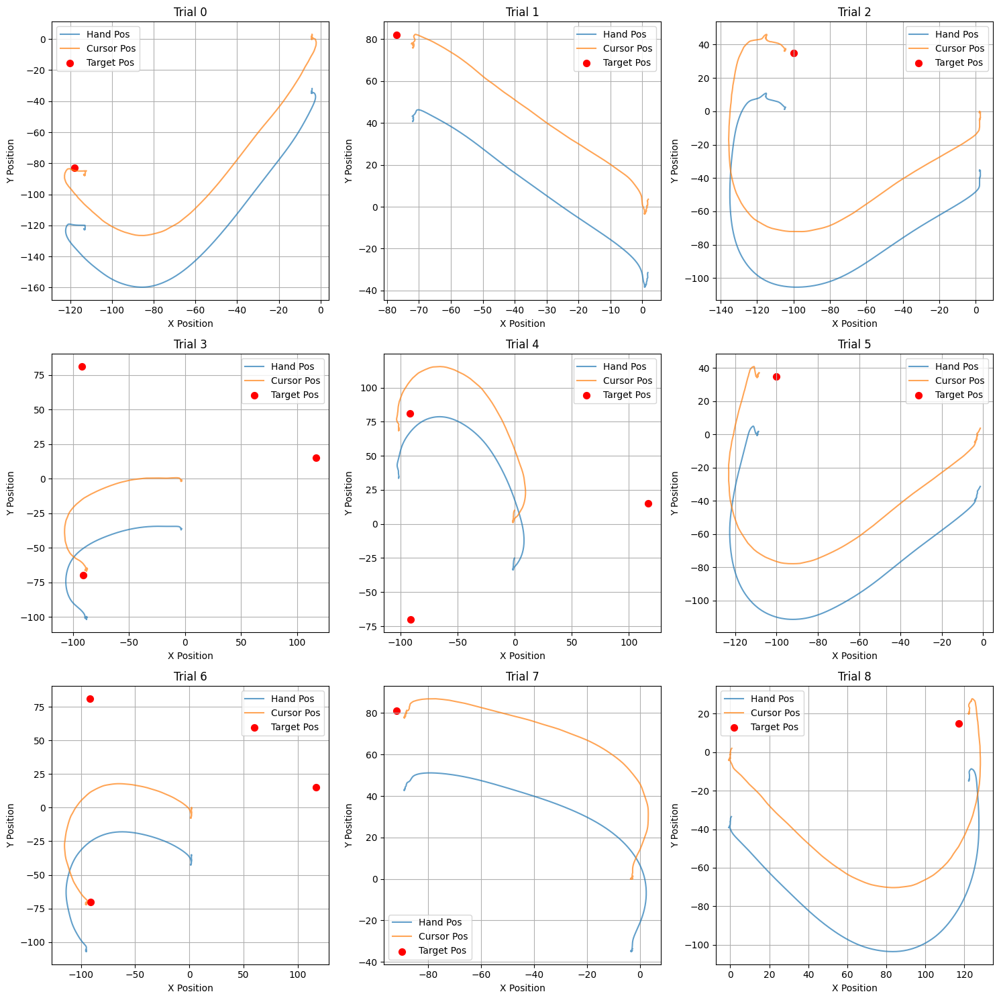

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Number of rows and columns for the grid plot
n_rows = 3
n_cols = 3
n_trials_to_plot = n_rows * n_cols

# Set up the grid for plotting
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 15))
axes = axes.flatten()

# Plot trajectories and target positions for each trial
for i in range(n_trials_to_plot):
    if i >= len(trial_data):
        break  # Stop if there are no more trials to plot

    trial = trial_data[i]
    ax = axes[i]

    # Plot hand position
    hand_pos = np.array(trial["hand_pos"])
    if hand_pos.size > 0:
        ax.plot(hand_pos[:, 0], hand_pos[:, 1], label="Hand Pos", alpha=0.7)

    # Plot cursor position
    cursor_pos = np.array(trial["cursor_pos"])
    if cursor_pos.size > 0:
        ax.plot(cursor_pos[:, 0], cursor_pos[:, 1], label="Cursor Pos", alpha=0.7)

    # Plot target position
    target_pos = np.array(trial["target_pos"])
    if target_pos.size > 0:
        ax.scatter(target_pos[:, 0], target_pos[:, 1], color="red", label="Target Pos", s=50)

    # Add trial information
    ax.set_title(f"Trial {trial['trial_id']}")
    ax.set_xlabel("X Position")
    ax.set_ylabel("Y Position")
    ax.legend()
    ax.grid(True)

# Adjust layout
plt.tight_layout()
plt.show()


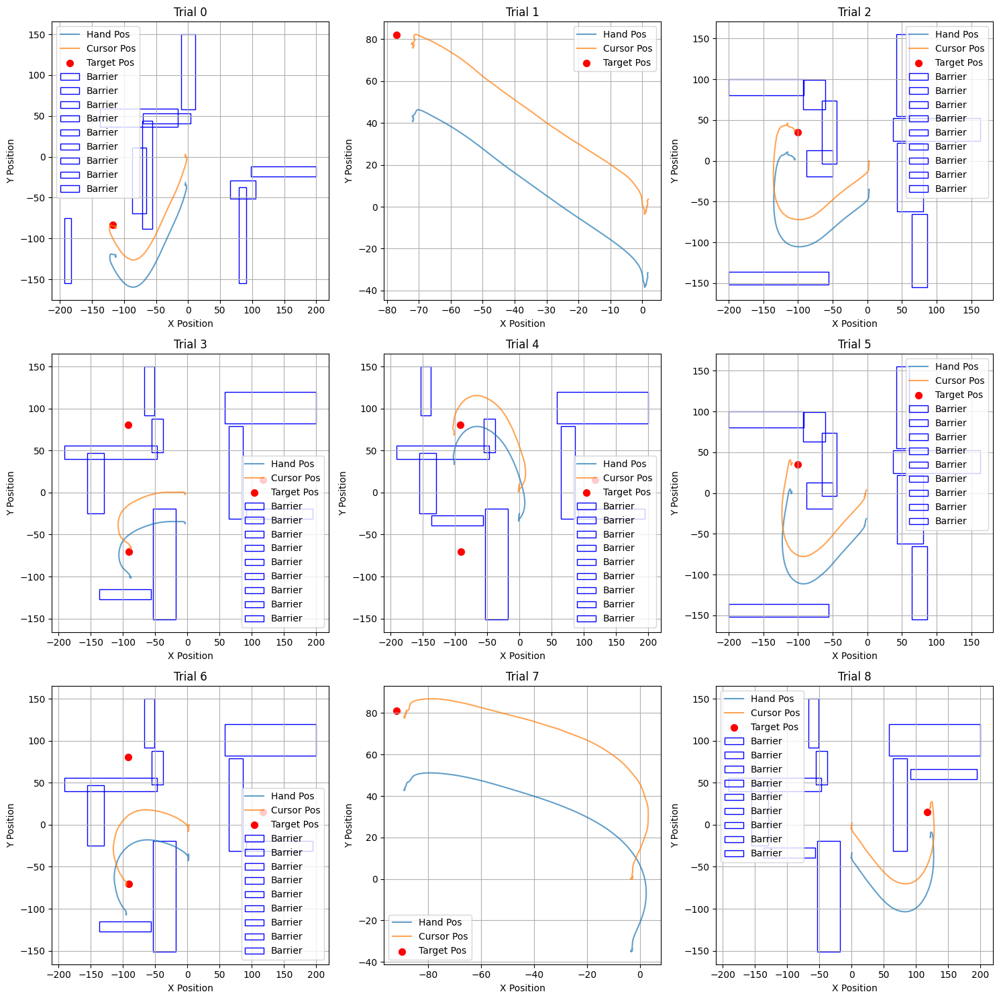

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np

# Number of rows and columns for the grid plot
n_rows = 3
n_cols = 3
n_trials_to_plot = n_rows * n_cols

# Set up the grid for plotting
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 15))
axes = axes.flatten()

# Plot trajectories, target positions, and barriers for each trial
for i in range(n_trials_to_plot):
    if i >= len(trial_data):
        break  # Stop if there are no more trials to plot

    trial = trial_data[i]
    ax = axes[i]

    # Plot hand position
    hand_pos = np.array(trial["hand_pos"])
    if hand_pos.size > 0:
        ax.plot(hand_pos[:, 0], hand_pos[:, 1], label="Hand Pos", alpha=0.7)

    # Plot cursor position
    cursor_pos = np.array(trial["cursor_pos"])
    if cursor_pos.size > 0:
        ax.plot(cursor_pos[:, 0], cursor_pos[:, 1], label="Cursor Pos", alpha=0.7)

    # Plot target position
    target_pos = np.array(trial["target_pos"])
    if target_pos.size > 0:
        ax.scatter(target_pos[:, 0], target_pos[:, 1], color="red", label="Target Pos", s=50)

    # Plot barriers
    barrier_pos = np.array(trial["barrier_pos"])
    if barrier_pos.size > 0:
        for barrier in barrier_pos:
            # Assuming barrier is represented as [x_center, y_center, half_width, half_height]
            x, y, half_width, half_height = barrier
            rect = patches.Rectangle(
                (x - half_width, y - half_height),  # Bottom-left corner
                2 * half_width,  # Width
                2 * half_height,  # Height
                linewidth=1,
                edgecolor="blue",
                facecolor="none",
                label="Barrier"
            )
            ax.add_patch(rect)

    # Add trial information
    ax.set_title(f"Trial {trial['trial_id']}")
    ax.set_xlabel("X Position")
    ax.set_ylabel("Y Position")
    ax.legend()
    ax.grid(True)

# Adjust layout
plt.tight_layout()
plt.savefig("plot_image.png")
plt.show()



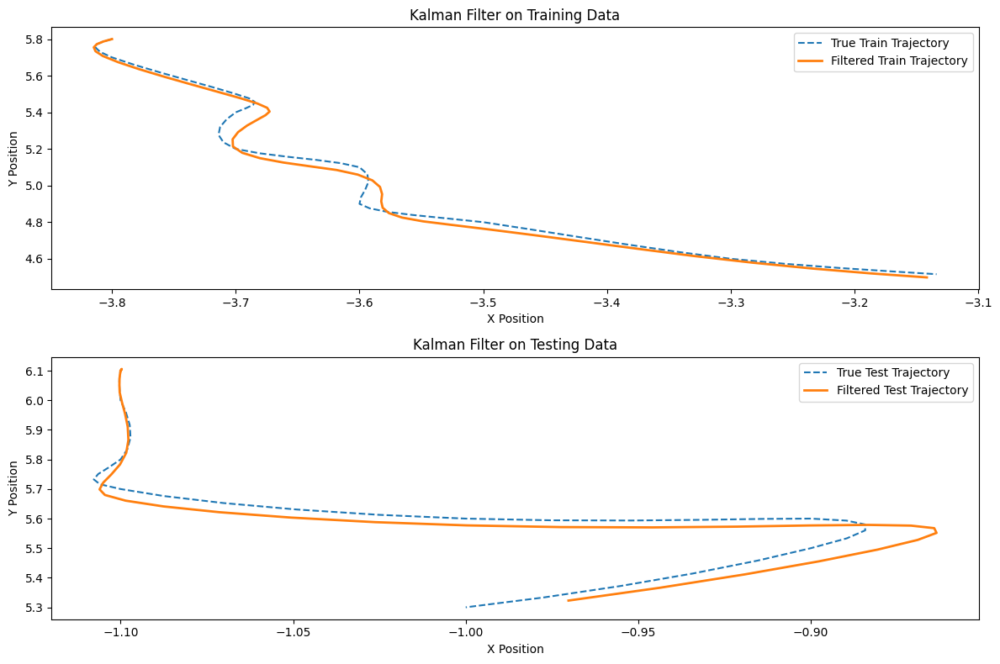

In [ ]:
import numpy as np
from filterpy.kalman import KalmanFilter
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

import json
with open("/content/drive/MyDrive/MLNBD/ML_Neuro/DATA ANALYTICS/trajectory_with_spike_data.json", "r") as f:
    data = json.load(f)

# Parameters
bin_size = 0.05  # Time bin size (e.g., 50ms)

def preprocess_trial(trial):
    """Preprocess a single trial, binning spike data and aligning cursor positions."""
    cursor_positions = np.array(trial["cursor_pos"])  # Shape (T, 2)
    spike_data = trial["spike_data"]                  # List of lists with spike timestamps

    # Calculate the number of bins
    num_bins = int((trial["stop_time"] - trial["start_time"]) / bin_size)

    # Preprocess spike data into fixed bins
    spike_features = np.zeros((len(spike_data), num_bins))  # Shape (num_neurons, num_bins)
    for neuron_idx, spikes in enumerate(spike_data):
        binned_spikes, _ = np.histogram(spikes, bins=np.linspace(0, trial["stop_time"], num_bins + 1))
        spike_features[neuron_idx, :] = binned_spikes

    # Combine spike features across neurons
    spike_summary = np.sum(spike_features, axis=0)  # Shape (num_bins,)

    # Truncate cursor positions to align with the number of bins
    cursor_positions = cursor_positions[:num_bins]

    return cursor_positions, spike_summary

# Preprocess all trials
all_cursor_positions = []
all_spike_summaries = []

for trial in data:
    cursor_positions, spike_summary = preprocess_trial(trial)
    all_cursor_positions.append(cursor_positions)
    all_spike_summaries.append(spike_summary)

# Split data into train and test sets based on trials
train_cursor_positions, test_cursor_positions, train_spike_summaries, test_spike_summaries = train_test_split(
    all_cursor_positions, all_spike_summaries, test_size=0.2, random_state=42
)

# Function to apply Kalman Filter to a single trial
def apply_kalman_filter(cursor_positions, spike_features):
    """Apply Kalman Filter to a single trial's cursor positions."""
    kf = KalmanFilter(dim_x=4, dim_z=2)  # 4 state variables (x, y, vx, vy), 2 measurements (x, y)

    kf.F = np.array([
        [1, 0, 1, 0],  # x_t = x_(t-1) + vx_(t-1)
        [0, 1, 0, 1],  # y_t = y_(t-1) + vy_(t-1)
        [0, 0, 1, 0],  # vx_t = vx_(t-1)
        [0, 0, 0, 1],  # vy_t = vy_(t-1)
    ])

    kf.H = np.array([
        [1, 0, 0, 0],  # Measure x
        [0, 1, 0, 0],  # Measure y
    ])

    kf.P = np.eye(4) * 1000
    kf.Q = np.eye(4) * 0.1
    kf.R = np.eye(2) * 10

    kf.x = np.array([cursor_positions[0, 0], cursor_positions[0, 1], 0, 0])

    filtered_positions = []
    for i, position in enumerate(cursor_positions):
        kf.predict()
        if i < len(spike_features):  # Incorporate spike feature scaling (optional)
            observation = position
        else:
            observation = np.zeros(2)
        kf.update(observation)
        filtered_positions.append(kf.x[:2])

    return np.array(filtered_positions)

# Apply Kalman Filter to training and testing trials
filtered_train_positions = [
    apply_kalman_filter(trial_cursor, trial_spike)
    for trial_cursor, trial_spike in zip(train_cursor_positions, train_spike_summaries)
]

filtered_test_positions = [
    apply_kalman_filter(trial_cursor, trial_spike)
    for trial_cursor, trial_spike in zip(test_cursor_positions, test_spike_summaries)
]

# Plot one example from training and testing
plt.figure(figsize=(12, 8))

# Training example
plt.subplot(2, 1, 1)
plt.plot(train_cursor_positions[0][:, 0], train_cursor_positions[0][:, 1], label="True Train Trajectory", linestyle="--")
plt.plot(filtered_train_positions[0][:, 0], filtered_train_positions[0][:, 1], label="Filtered Train Trajectory", linewidth=2)
plt.title("Kalman Filter on Training Data")
plt.legend()
plt.xlabel("X Position")
plt.ylabel("Y Position")

# Testing example
plt.subplot(2, 1, 2)
plt.plot(test_cursor_positions[0][:, 0], test_cursor_positions[0][:, 1], label="True Test Trajectory", linestyle="--")
plt.plot(filtered_test_positions[0][:, 0], filtered_test_positions[0][:, 1], label="Filtered Test Trajectory", linewidth=2)
plt.title("Kalman Filter on Testing Data")
plt.legend()
plt.xlabel("X Position")
plt.ylabel("Y Position")

plt.tight_layout()
plt.show()


In [ ]:
from sklearn.metrics import mean_squared_error

def calculate_rmse(true_positions, predicted_positions):
    errors = []
    for true, pred in zip(true_positions, predicted_positions):
        rmse = np.sqrt(mean_squared_error(true, pred))
        errors.append(rmse)
    return np.mean(errors), errors  # Mean RMSE across all trials

# Calculate RMSE for train and test data
train_rmse, train_rmse_per_trial = calculate_rmse(train_cursor_positions, filtered_train_positions)
test_rmse, test_rmse_per_trial = calculate_rmse(test_cursor_positions, filtered_test_positions)

print(f"Training RMSE: {train_rmse}")
print(f"Testing RMSE: {test_rmse}")


Training RMSE: 0.01683899105513458
Testing RMSE: 0.01593872038443084


In [ ]:
from sklearn.metrics import explained_variance_score

def calculate_explained_variance(true_positions, predicted_positions):
    scores = []
    for true, pred in zip(true_positions, predicted_positions):
        score = explained_variance_score(true, pred)
        scores.append(score)
    return np.mean(scores), scores  # Mean explained variance across all trials

# Calculate explained variance for train and test data
train_ev, train_ev_per_trial = calculate_explained_variance(train_cursor_positions, filtered_train_positions)
test_ev, test_ev_per_trial = calculate_explained_variance(test_cursor_positions, filtered_test_positions)

print(f"Training Explained Variance: {train_ev}")
print(f"Testing Explained Variance: {test_ev}")

Training Explained Variance: 0.9773986086837375
Testing Explained Variance: 0.987077231655942


KALMAN with traial based split

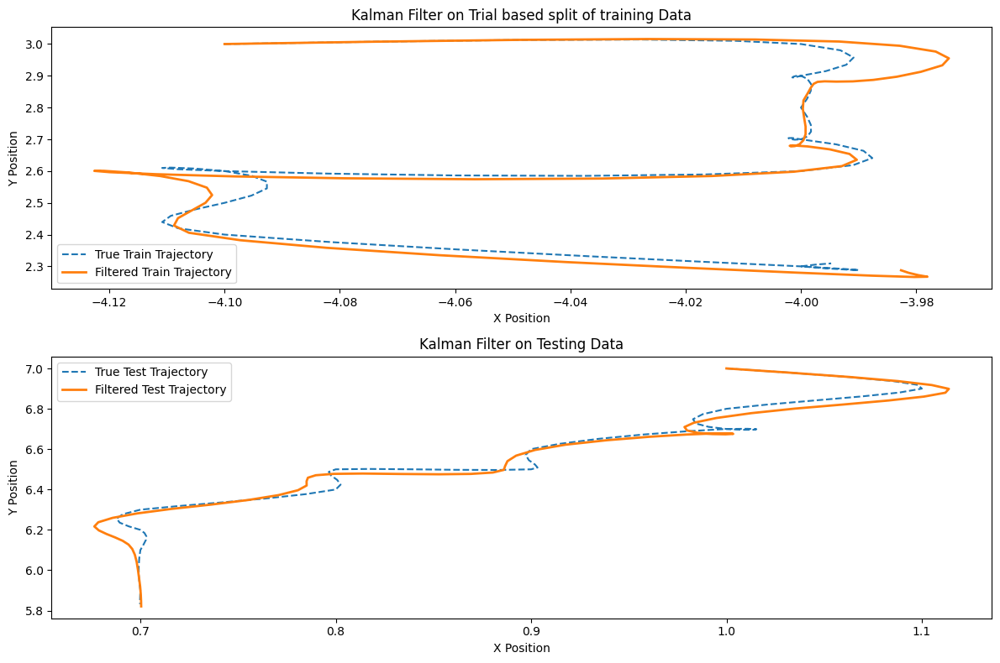

In [16]:
import numpy as np
from filterpy.kalman import KalmanFilter
import matplotlib.pyplot as plt

# Example dataset with multiple trials
# Replace `data` with your actual list of trials
# Assuming `data` is a list of dictionaries, each representing one trial

# Parameters
bin_size = 0.05  # Time bin size (e.g., 50ms)

def preprocess_trial(trial):
    """Preprocess a single trial, binning spike data and aligning cursor positions."""
    cursor_positions = np.array(trial["cursor_pos"])  # Shape (T, 2)
    spike_data = trial["spike_data"]                  # List of lists with spike timestamps

    # Calculate the number of bins
    num_bins = int((trial["stop_time"] - trial["start_time"]) / bin_size)

    # Preprocess spike data into fixed bins
    spike_features = np.zeros((len(spike_data), num_bins))  # Shape (num_neurons, num_bins)
    for neuron_idx, spikes in enumerate(spike_data):
        binned_spikes, _ = np.histogram(spikes, bins=np.linspace(0, trial["stop_time"], num_bins + 1))
        spike_features[neuron_idx, :] = binned_spikes

    # Combine spike features across neurons
    spike_summary = np.sum(spike_features, axis=0)  # Shape (num_bins,)

    # Truncate cursor positions to align with the number of bins
    cursor_positions = cursor_positions[:num_bins]

    return cursor_positions, spike_summary

# Preprocess all trials
all_cursor_positions = []
all_spike_summaries = []

for trial in data:
    cursor_positions, spike_summary = preprocess_trial(trial)
    all_cursor_positions.append(cursor_positions)
    all_spike_summaries.append(spike_summary)

# Split data into training and testing sets by trial index
num_trials = len(data)
train_indices = list(range(80))  # First 80 trials
test_indices = list(range(80, num_trials))  # Remaining trials

train_cursor_positions = [all_cursor_positions[i] for i in train_indices]
test_cursor_positions = [all_cursor_positions[i] for i in test_indices]

train_spike_summaries = [all_spike_summaries[i] for i in train_indices]
test_spike_summaries = [all_spike_summaries[i] for i in test_indices]

# Function to apply Kalman Filter to a single trial
def apply_kalman_filter(cursor_positions, spike_features):
    """Apply Kalman Filter to a single trial's cursor positions."""
    kf = KalmanFilter(dim_x=4, dim_z=2)  # 4 state variables (x, y, vx, vy), 2 measurements (x, y)

    kf.F = np.array([
        [1, 0, 1, 0],  # x_t = x_(t-1) + vx_(t-1)
        [0, 1, 0, 1],  # y_t = y_(t-1) + vy_(t-1)
        [0, 0, 1, 0],  # vx_t = vx_(t-1)
        [0, 0, 0, 1],  # vy_t = vy_(t-1)
    ])

    kf.H = np.array([
        [1, 0, 0, 0],  # Measure x
        [0, 1, 0, 0],  # Measure y
    ])

    kf.P = np.eye(4) * 1000
    kf.Q = np.eye(4) * 0.1
    kf.R = np.eye(2) * 10

    kf.x = np.array([cursor_positions[0, 0], cursor_positions[0, 1], 0, 0])

    filtered_positions = []
    for i, position in enumerate(cursor_positions):
        kf.predict()
        if i < len(spike_features):  # Incorporate spike feature scaling (optional)
            observation = position
        else:
            observation = np.zeros(2)
        kf.update(observation)
        filtered_positions.append(kf.x[:2])

    return np.array(filtered_positions)

# Apply Kalman Filter to training and testing trials
filtered_train_positions = [
    apply_kalman_filter(trial_cursor, trial_spike)
    for trial_cursor, trial_spike in zip(train_cursor_positions, train_spike_summaries)
]

filtered_test_positions = [
    apply_kalman_filter(trial_cursor, trial_spike)
    for trial_cursor, trial_spike in zip(test_cursor_positions, test_spike_summaries)
]

# Plot one example from training and testing
plt.figure(figsize=(12, 8))

# Training example
plt.subplot(2, 1, 1)
plt.plot(train_cursor_positions[0][:, 0], train_cursor_positions[0][:, 1], label="True Train Trajectory", linestyle="--")
plt.plot(filtered_train_positions[0][:, 0], filtered_train_positions[0][:, 1], label="Filtered Train Trajectory", linewidth=2)
plt.title("Kalman Filter on Trial based split of training Data")
plt.legend()
plt.xlabel("X Position")
plt.ylabel("Y Position")

# Testing example
plt.subplot(2, 1, 2)
plt.plot(test_cursor_positions[0][:, 0], test_cursor_positions[0][:, 1], label="True Test Trajectory", linestyle="--")
plt.plot(filtered_test_positions[0][:, 0], filtered_test_positions[0][:, 1], label="Filtered Test Trajectory", linewidth=2)
plt.title("Kalman Filter on Testing Data")
plt.legend()
plt.xlabel("X Position")
plt.ylabel("Y Position")
plt.savefig("kl_train.png", format='png', dpi=300)
plt.tight_layout()
plt.show()


In [28]:
import json
with open("/content/drive/MyDrive/MLNBD/ML_Neuro/DATA ANALYTICS/trajectory_with_spike_data.json", "r") as f:
    trial_data = json.load(f)

In [22]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
from filterpy.kalman import KalmanFilter

# Function to preprocess trial data for cursor positions
def preprocess_trial(trial):
    """Extract cursor positions from trial data."""
    cursor_positions = np.array(trial["cursor_pos"])  # Shape (T, 2)
    return cursor_positions

# Function to apply Kalman Filter to predict the trajectory for a single trial
def apply_kalman_filter(cursor_positions):
    """Apply Kalman Filter to predict the entire cursor trajectory."""
    if cursor_positions.size == 0:
        return np.array([])

    # Define Kalman Filter with 4 state variables (x, y, vx, vy) and 2 measurements (x, y)
    kf = KalmanFilter(dim_x=4, dim_z=2)

    # Define the state transition matrix (F) and measurement matrix (H)
    kf.F = np.array([
        [1, 0, 1, 0],  # x_t = x_(t-1) + vx_(t-1)
        [0, 1, 0, 1],  # y_t = y_(t-1) + vy_(t-1)
        [0, 0, 1, 0],  # vx_t = vx_(t-1)
        [0, 0, 0, 1],  # vy_t = vy_(t-1)
    ])
    kf.H = np.array([
        [1, 0, 0, 0],  # Measure x
        [0, 1, 0, 0],  # Measure y
    ])

    # Initialize covariances
    kf.P = np.eye(4) * 1000  # Initial uncertainty
    kf.Q = np.eye(4) * 0.1   # Process noise
    kf.R = np.eye(2) * 10    # Measurement noise

    # Initialize the state vector [x, y, vx, vy]
    kf.x = np.array([cursor_positions[0, 0], cursor_positions[0, 1], 0, 0])

    # Predict the trajectory
    filtered_positions = []
    for position in cursor_positions:
        kf.predict()
        kf.update(position)
        filtered_positions.append(kf.x[:2])  # Append the predicted position [x, y]

    return np.array(filtered_positions)

# Apply Kalman Filter to all trials and predict trajectories
predicted_trajectories = []
for trial in trial_data:
    cursor_positions = preprocess_trial(trial)
    predicted_cursor = apply_kalman_filter(cursor_positions)
    predicted_trajectories.append(predicted_cursor)

# Plot each trial's actual and predicted trajectories
for i, trial in enumerate(trial_data):
    # Extract actual and predicted cursor positions
    actual_cursor = np.array(trial["cursor_pos"])
    predicted_cursor = predicted_trajectories[i]

    # Start a new figure for each trial
    plt.figure(figsize=(10, 8))

    # Plot actual cursor trajectory
    if actual_cursor.size > 0:
        plt.plot(actual_cursor[:, 0], actual_cursor[:, 1], label="Actual Cursor", linestyle="--", color="green")

    # Plot predicted cursor trajectory
    if predicted_cursor.size > 0:
        plt.plot(predicted_cursor[:, 0], predicted_cursor[:, 1], label="Predicted Cursor", color="orange")

    # Plot target positions
    target_pos = np.array(trial["target_pos"])
    if target_pos.size > 0:
        plt.scatter(target_pos[:, 0], target_pos[:, 1], color="red", label="Target Pos", s=50)

    # Plot barriers
    barrier_pos = np.array(trial["barrier_pos"])
    if barrier_pos.size > 0:
        for barrier in barrier_pos:
            # Assuming barrier is represented as [x_center, y_center, half_width, half_height]
            x, y, half_width, half_height = barrier
            rect = patches.Rectangle(
                (x - half_width, y - half_height),  # Bottom-left corner
                2 * half_width,  # Width
                2 * half_height,  # Height
                linewidth=1,
                edgecolor="blue",
                facecolor="none",
                label="Barrier"
            )
            plt.gca().add_patch(rect)

    # Add plot labels and title
    plt.title(f"Trial {trial['trial_id']}")
    plt.xlabel("X Position")
    plt.ylabel("Y Position")
    plt.legend()
    plt.grid(True)
    plt.axis("equal")

    # Show the plot
    plt.show()


Output hidden; open in https://colab.research.google.com to view.

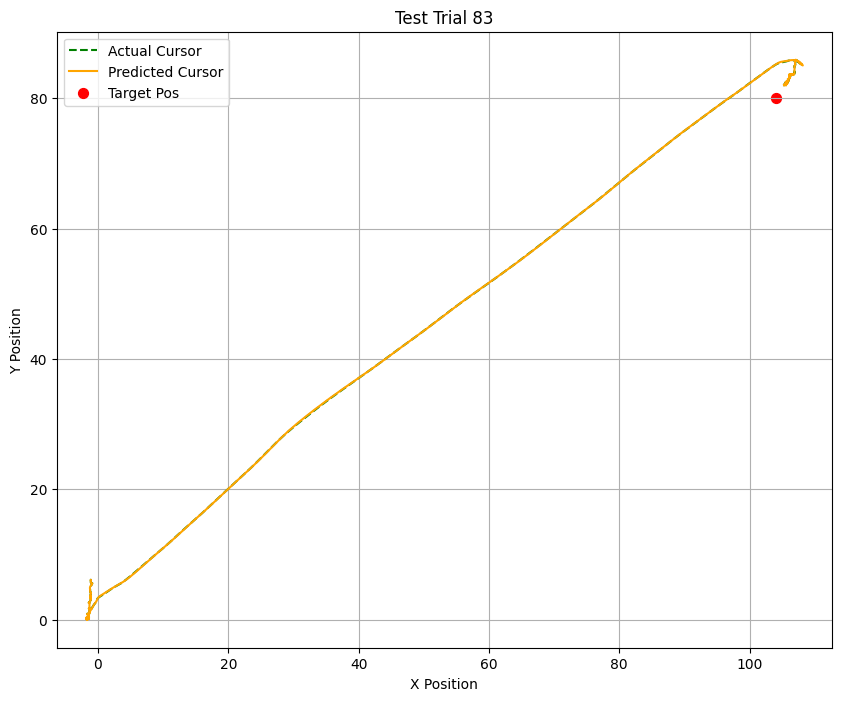

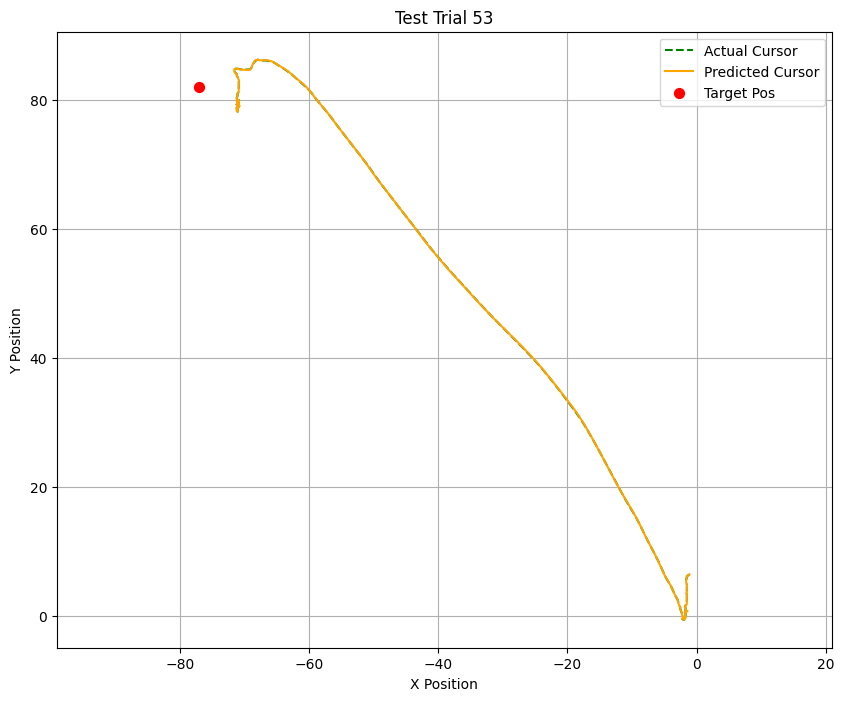

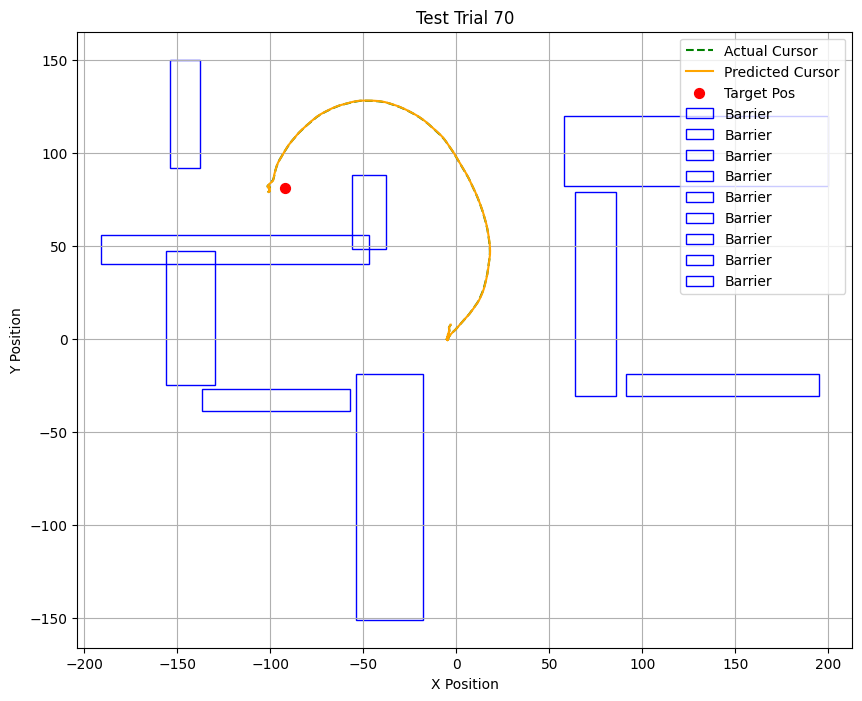

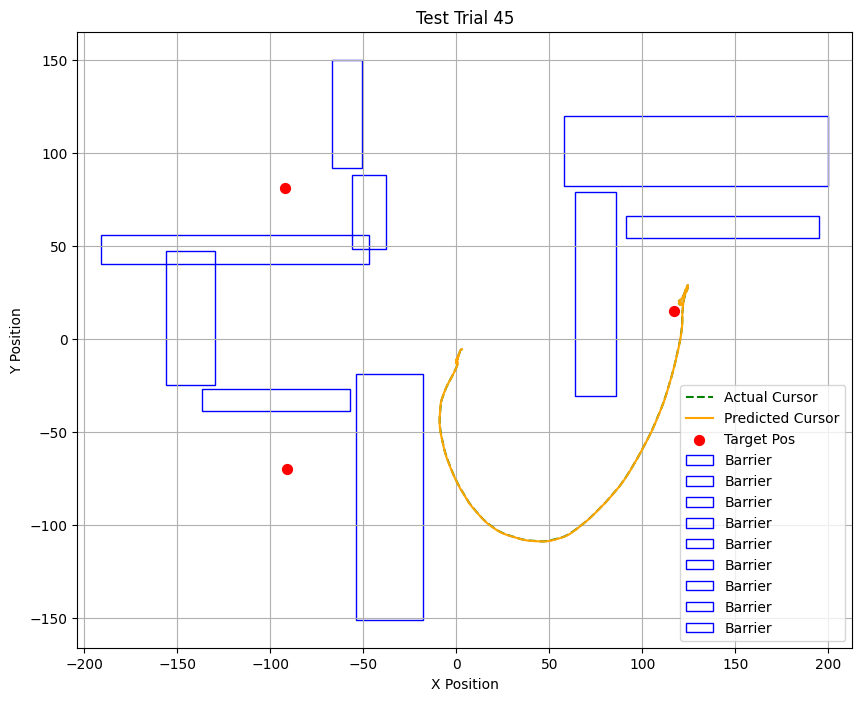

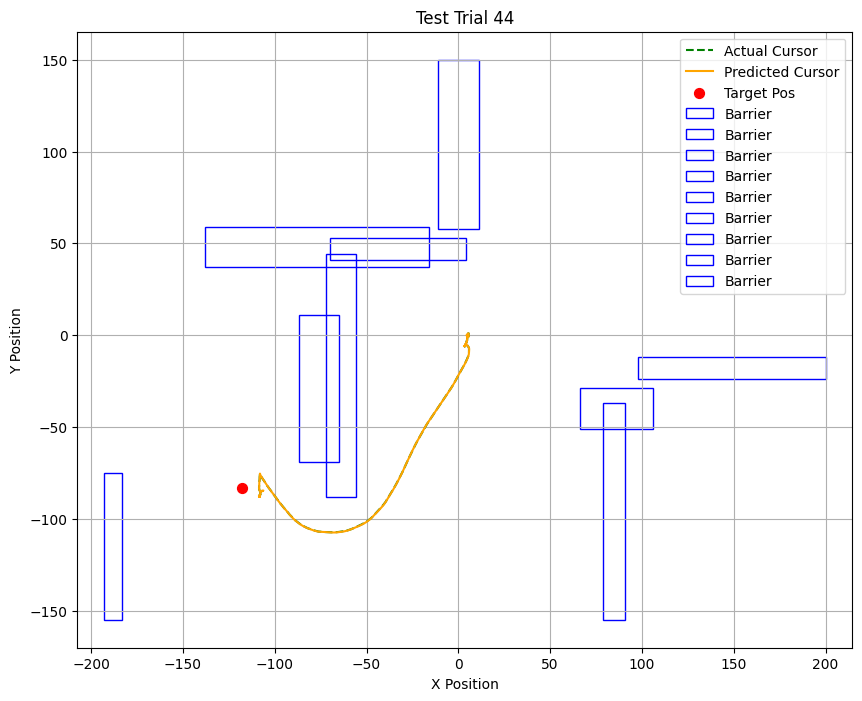

...

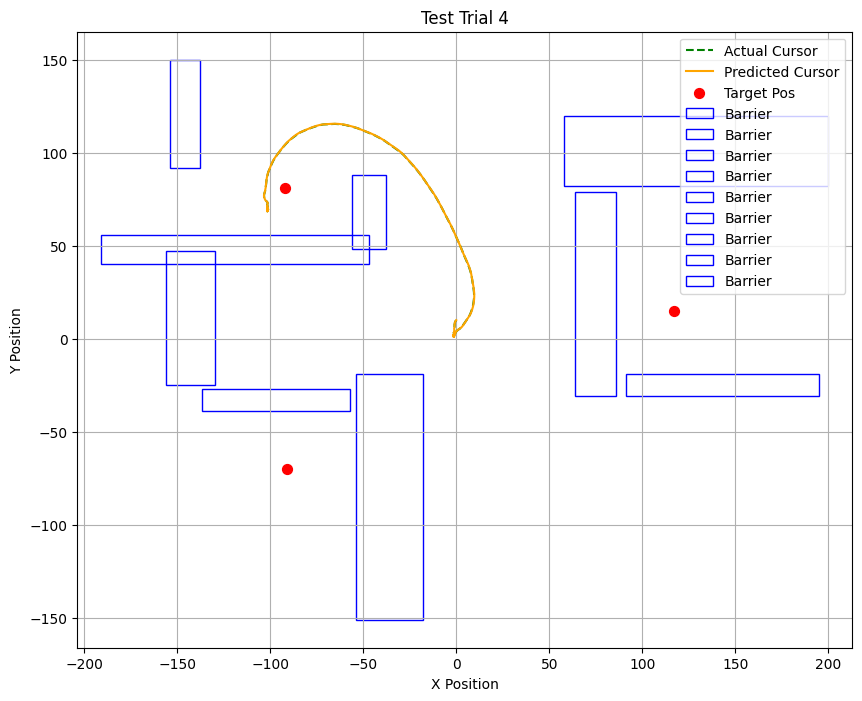

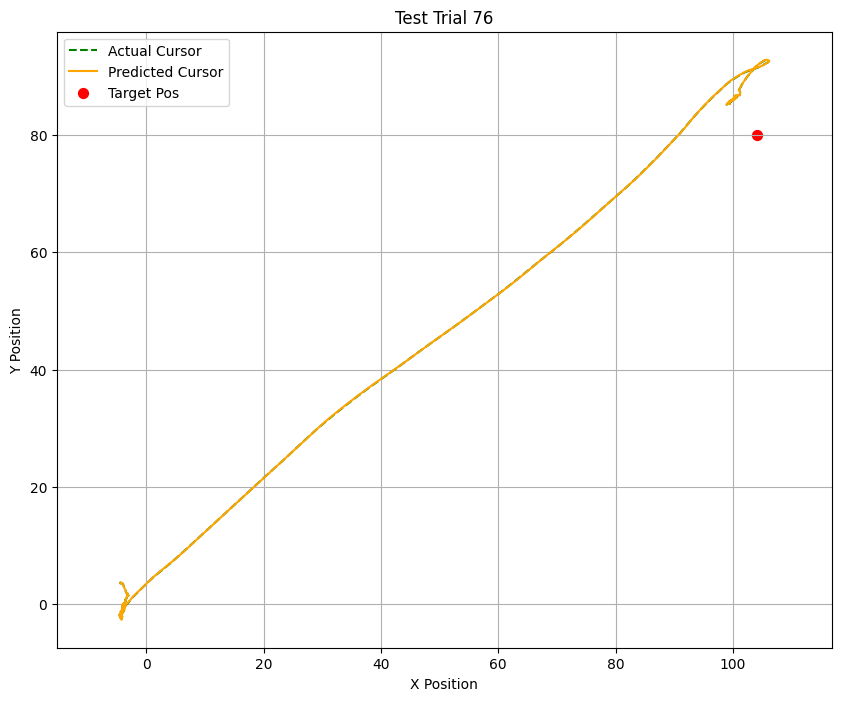

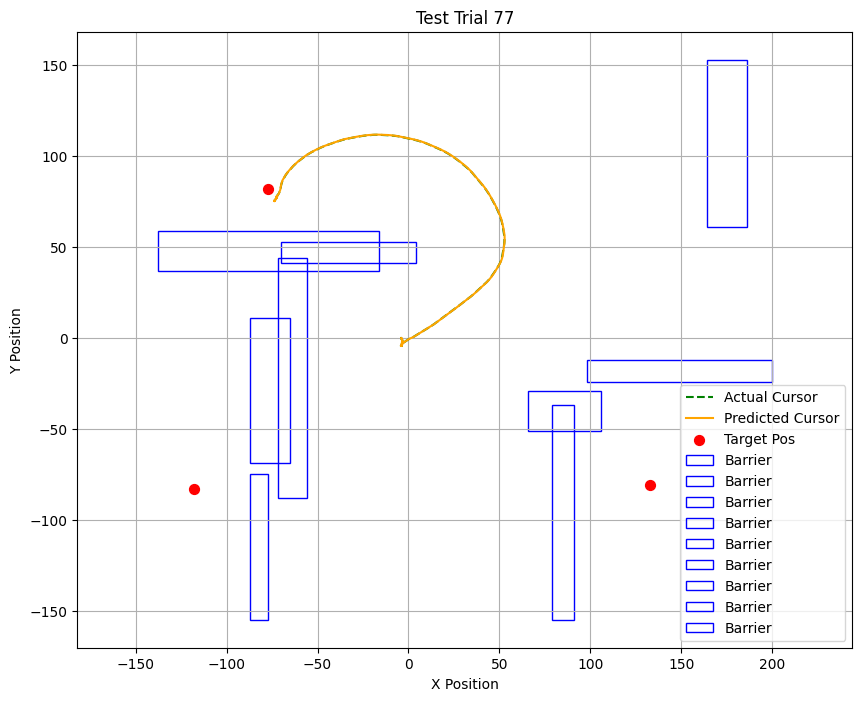

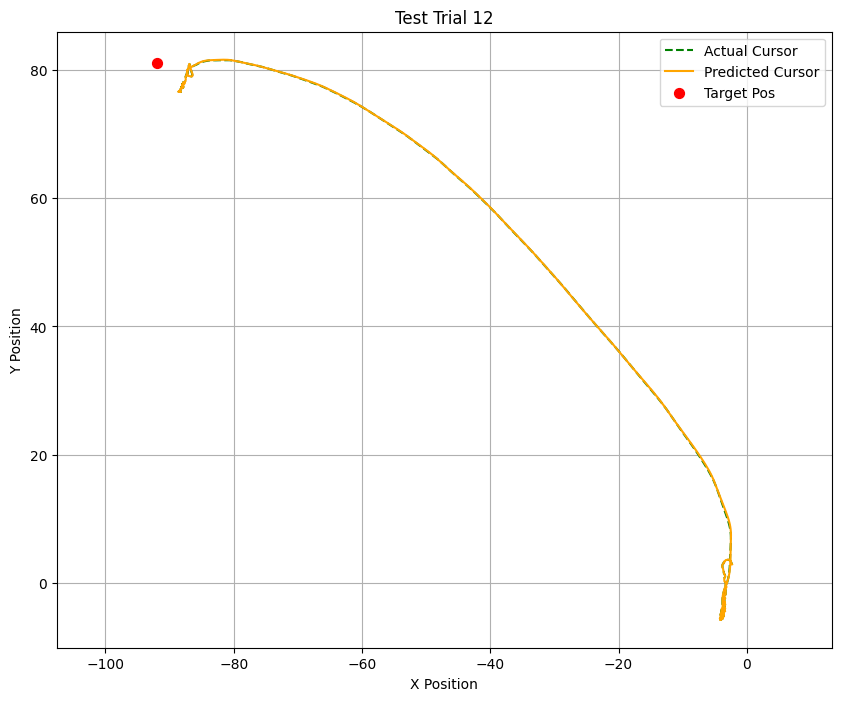

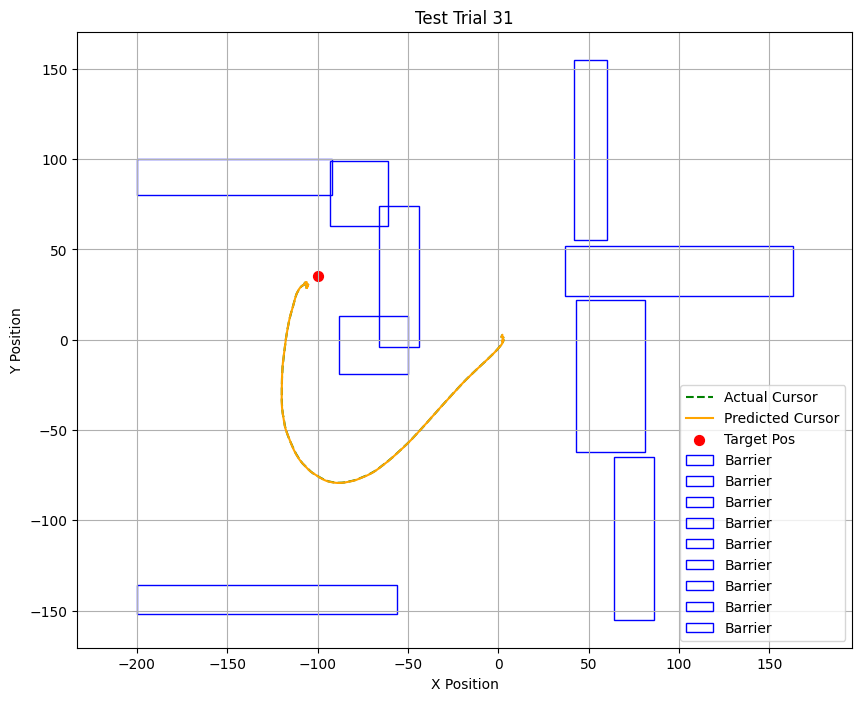

In [23]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
from filterpy.kalman import KalmanFilter
from sklearn.model_selection import train_test_split

# Function to preprocess trial data for cursor positions
def preprocess_trial(trial):
    """Extract cursor positions from trial data."""
    cursor_positions = np.array(trial["cursor_pos"])  # Shape (T, 2)
    return cursor_positions

# Function to apply Kalman Filter to predict the trajectory for a single trial
def apply_kalman_filter(cursor_positions):
    """Apply Kalman Filter to predict the entire cursor trajectory."""
    if cursor_positions.size == 0:
        return np.array([])

    # Define Kalman Filter with 4 state variables (x, y, vx, vy) and 2 measurements (x, y)
    kf = KalmanFilter(dim_x=4, dim_z=2)

    # Define the state transition matrix (F) and measurement matrix (H)
    kf.F = np.array([
        [1, 0, 1, 0],  # x_t = x_(t-1) + vx_(t-1)
        [0, 1, 0, 1],  # y_t = y_(t-1) + vy_(t-1)
        [0, 0, 1, 0],  # vx_t = vx_(t-1)
        [0, 0, 0, 1],  # vy_t = vy_(t-1)
    ])
    kf.H = np.array([
        [1, 0, 0, 0],  # Measure x
        [0, 1, 0, 0],  # Measure y
    ])

    # Initialize covariances
    kf.P = np.eye(4) * 1000  # Initial uncertainty
    kf.Q = np.eye(4) * 0.1   # Process noise
    kf.R = np.eye(2) * 10    # Measurement noise

    # Initialize the state vector [x, y, vx, vy]
    kf.x = np.array([cursor_positions[0, 0], cursor_positions[0, 1], 0, 0])

    # Predict the trajectory
    filtered_positions = []
    for position in cursor_positions:
        kf.predict()
        kf.update(position)
        filtered_positions.append(kf.x[:2])  # Append the predicted position [x, y]

    return np.array(filtered_positions)

# Split data into training and testing sets based on trial IDs
train_data, test_data = train_test_split(trial_data, test_size=0.2, random_state=42, shuffle=True)

# Apply Kalman Filter to training trials and testing trials
predicted_train_trajectories = []
predicted_test_trajectories = []

for trial in train_data:
    cursor_positions = preprocess_trial(trial)
    predicted_cursor = apply_kalman_filter(cursor_positions)
    predicted_train_trajectories.append(predicted_cursor)

for trial in test_data:
    cursor_positions = preprocess_trial(trial)
    predicted_cursor = apply_kalman_filter(cursor_positions)
    predicted_test_trajectories.append(predicted_cursor)

# Plot actual and predicted trajectories for test trials
for i, trial in enumerate(test_data):
    # Extract actual and predicted cursor positions
    actual_cursor = np.array(trial["cursor_pos"])
    predicted_cursor = predicted_test_trajectories[i]

    # Start a new figure for each test trial
    plt.figure(figsize=(10, 8))

    # Plot actual cursor trajectory
    if actual_cursor.size > 0:
        plt.plot(actual_cursor[:, 0], actual_cursor[:, 1], label="Actual Cursor", linestyle="--", color="green")

    # Plot predicted cursor trajectory
    if predicted_cursor.size > 0:
        plt.plot(predicted_cursor[:, 0], predicted_cursor[:, 1], label="Predicted Cursor", color="orange")

    # Plot target positions
    target_pos = np.array(trial["target_pos"])
    if target_pos.size > 0:
        plt.scatter(target_pos[:, 0], target_pos[:, 1], color="red", label="Target Pos", s=50)

    # Plot barriers
    barrier_pos = np.array(trial["barrier_pos"])
    if barrier_pos.size > 0:
        for barrier in barrier_pos:
            # Assuming barrier is represented as [x_center, y_center, half_width, half_height]
            x, y, half_width, half_height = barrier
            rect = patches.Rectangle(
                (x - half_width, y - half_height),  # Bottom-left corner
                2 * half_width,  # Width
                2 * half_height,  # Height
                linewidth=1,
                edgecolor="blue",
                facecolor="none",
                label="Barrier"
            )
            plt.gca().add_patch(rect)

    # Add plot labels and title
    plt.title(f"Test Trial {trial['trial_id']}")
    plt.xlabel("X Position")
    plt.ylabel("Y Position")
    plt.legend()
    plt.grid(True)
    plt.axis("equal")

    # Show the plot
    plt.show()


Correct

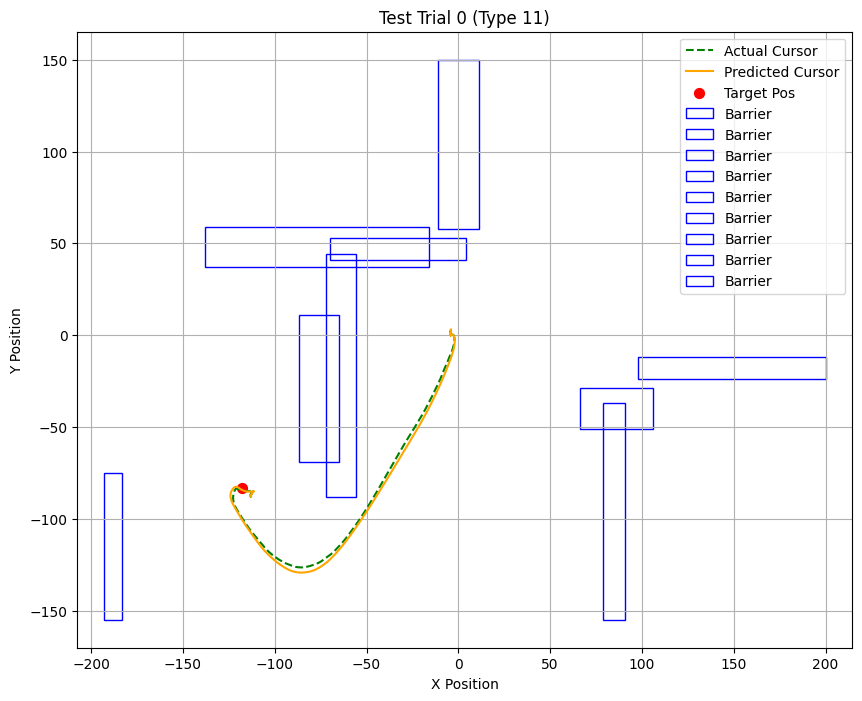

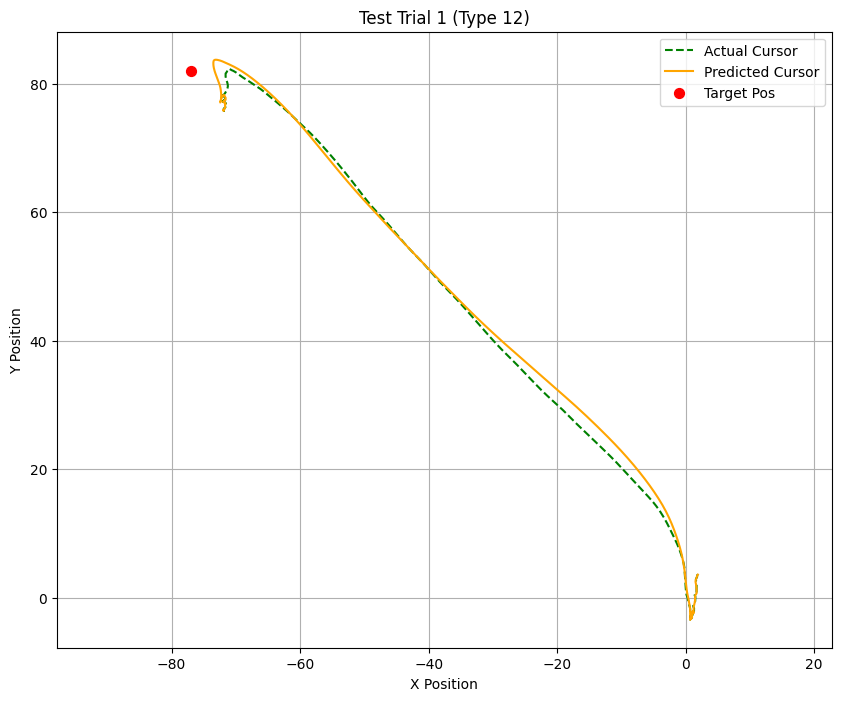

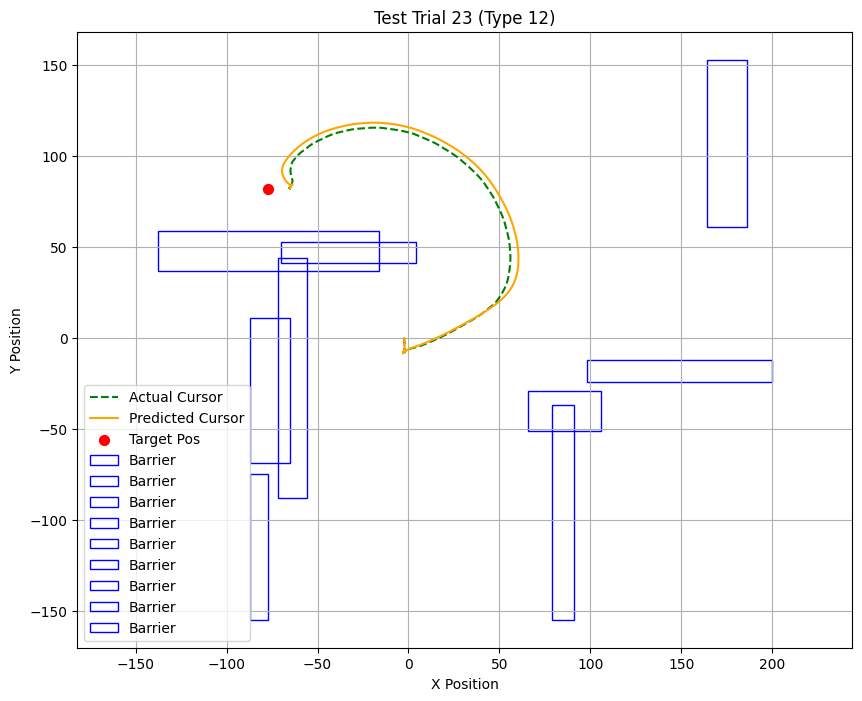

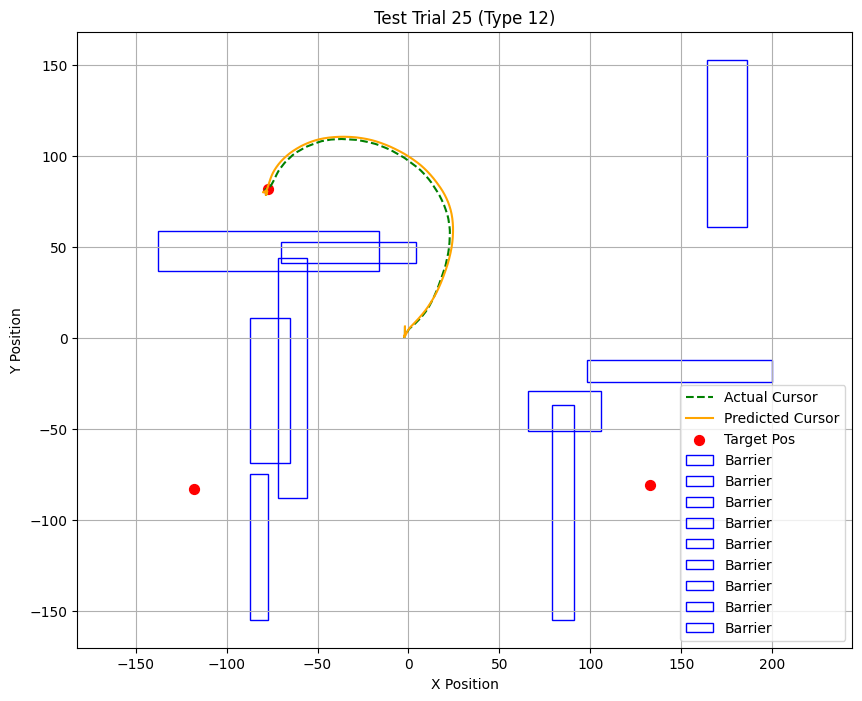

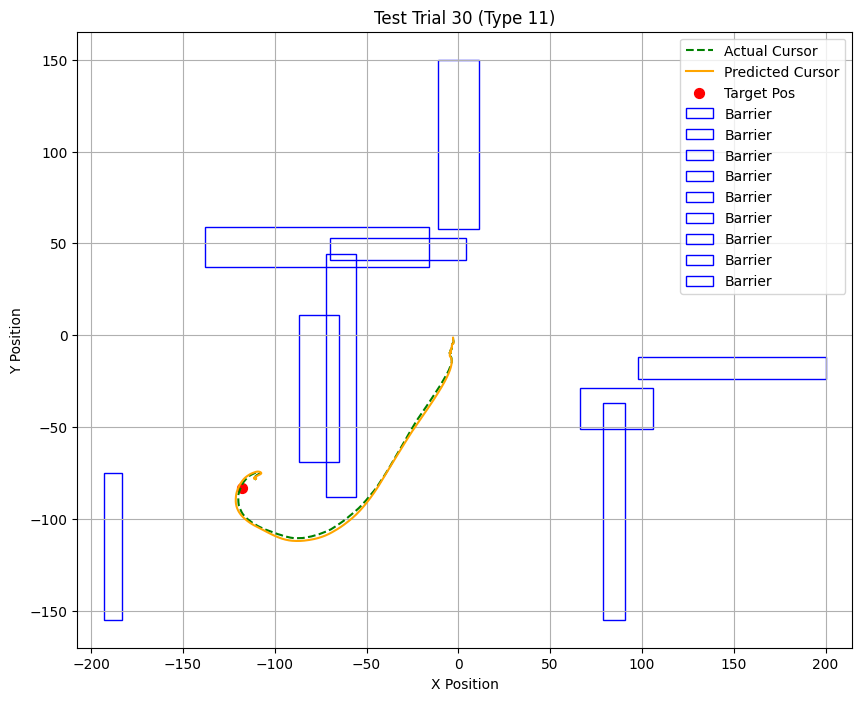

...

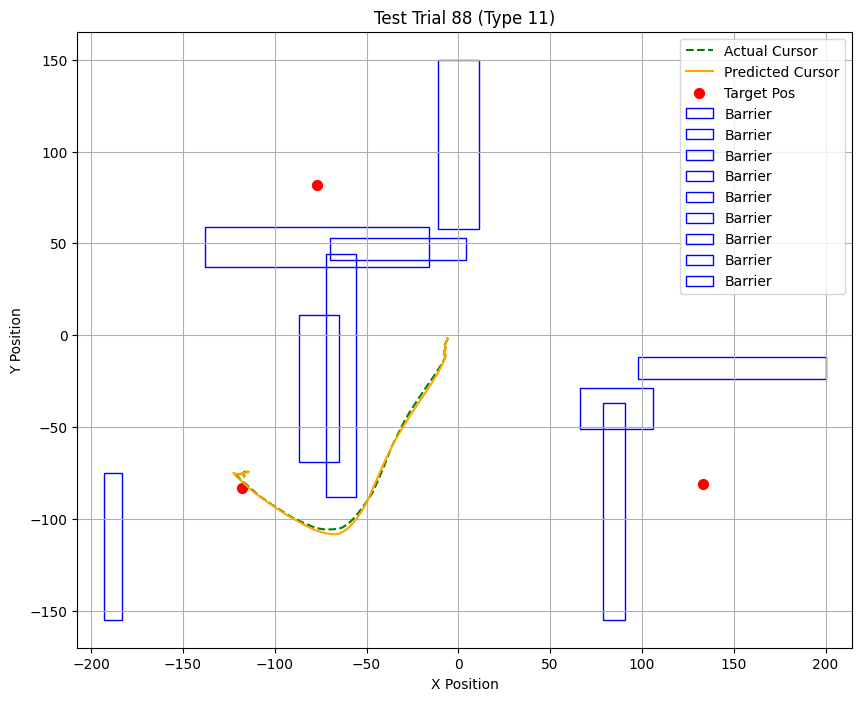

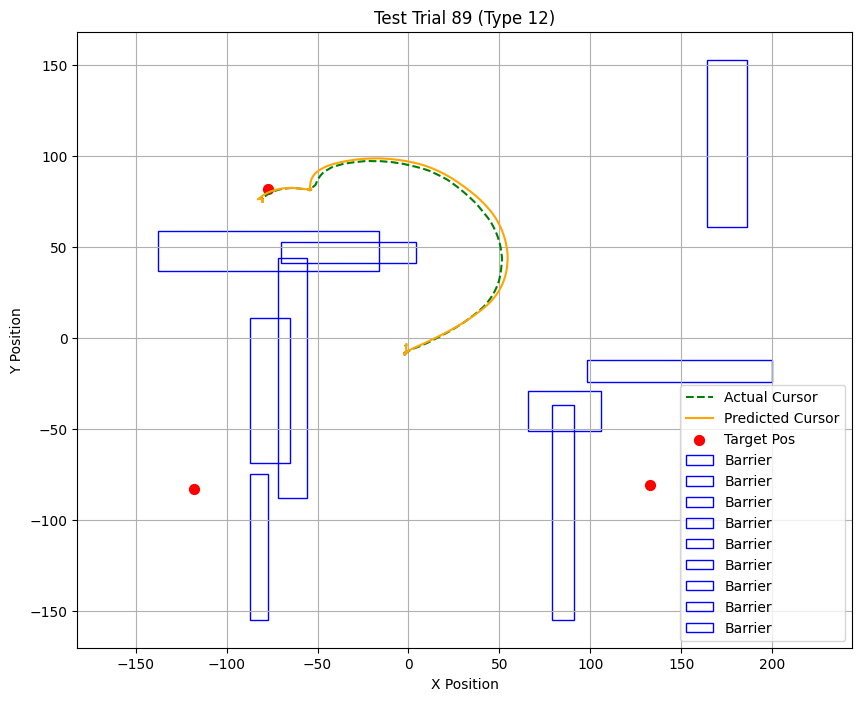

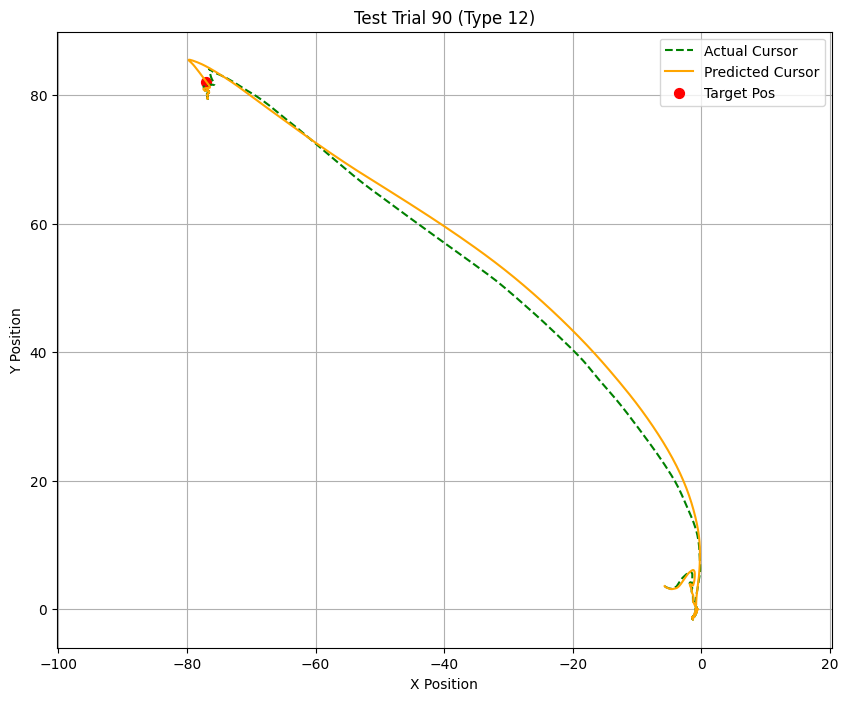

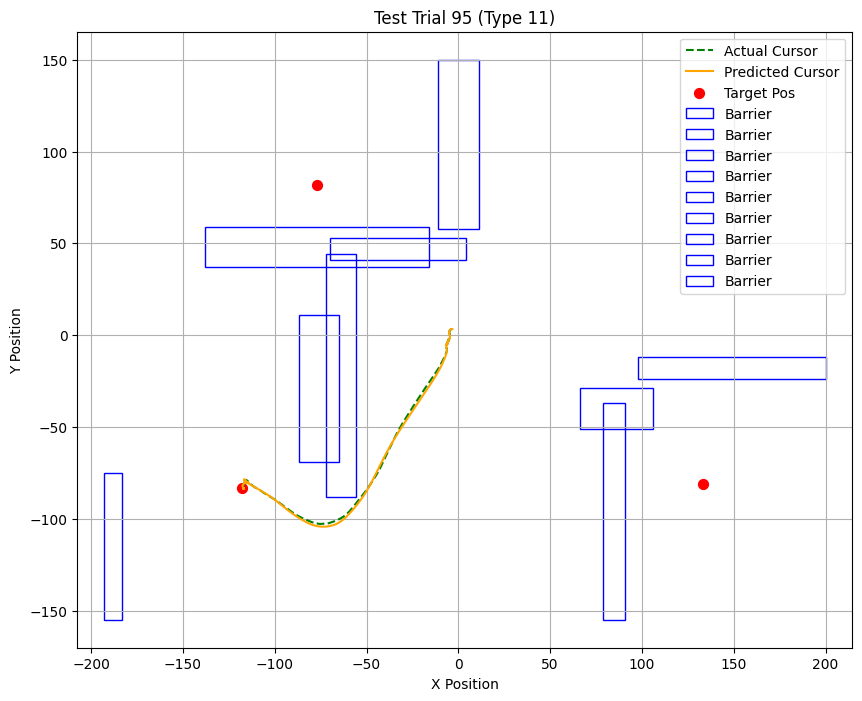

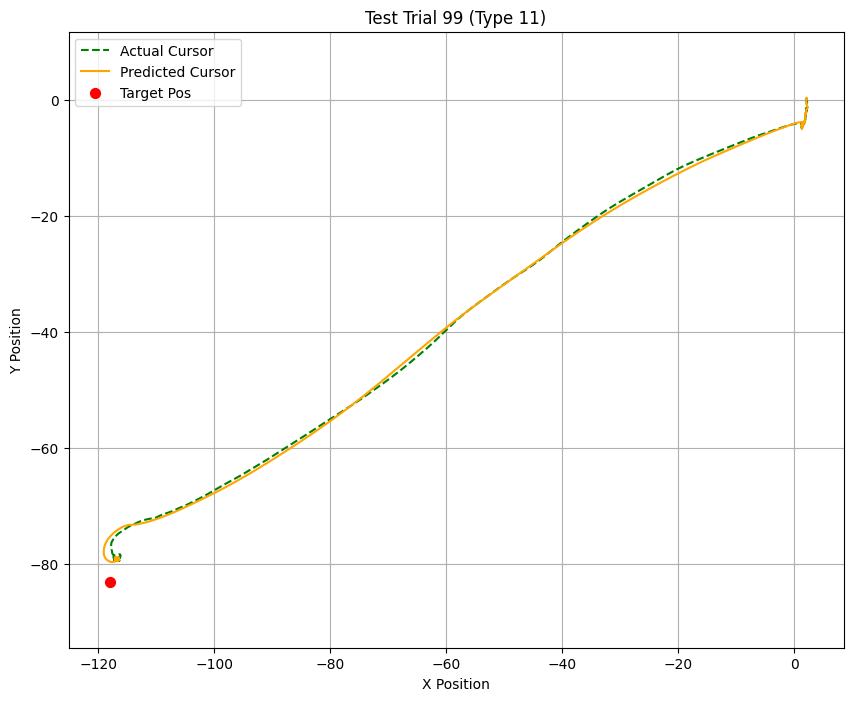

In [29]:
# Adjust training function to generate appropriate dimensions for Q
def train_kalman_filter(train_data):
    """Train Kalman Filter using training data to estimate noise covariances."""
    all_deltas = []  # To collect state transitions

    for trial in train_data:
        cursor_positions = preprocess_trial(trial)
        if cursor_positions.shape[0] < 2:
            continue  # Skip if there's not enough data

        # Calculate position differences (dx, dy) as velocity
        deltas = np.diff(cursor_positions, axis=0)
        velocities = np.hstack([deltas, deltas])  # Simulate [vx, vy] with deltas
        all_deltas.append(velocities)

    # Combine all deltas
    all_deltas = np.vstack(all_deltas)

    # Create a 4x4 process noise covariance matrix (Q)
    process_noise_cov = np.eye(4) * np.var(all_deltas)

    # Measurement noise covariance (R) can be estimated as the variance of observed positions
    all_positions = np.vstack([preprocess_trial(trial) for trial in train_data if len(trial["cursor_pos"]) > 0])
    measurement_noise_cov = np.eye(2) * np.var(all_positions, axis=0)

    return process_noise_cov, measurement_noise_cov


# Function to apply Kalman Filter to predict trajectory
def apply_kalman_filter(cursor_positions, Q, R):
    """Apply Kalman Filter to predict the entire cursor trajectory."""
    if cursor_positions.size == 0:
        return np.array([])

    # Define Kalman Filter with 4 state variables (x, y, vx, vy) and 2 measurements (x, y)
    kf = KalmanFilter(dim_x=4, dim_z=2)

    # Define the state transition matrix (F) and measurement matrix (H)
    kf.F = np.array([
        [1, 0, 1, 0],  # x_t = x_(t-1) + vx_(t-1)
        [0, 1, 0, 1],  # y_t = y_(t-1) + vy_(t-1)
        [0, 0, 1, 0],  # vx_t = vx_(t-1)
        [0, 0, 0, 1],  # vy_t = vy_(t-1)
    ])
    kf.H = np.array([
        [1, 0, 0, 0],  # Measure x
        [0, 1, 0, 0],  # Measure y
    ])

    # Covariances
    kf.P = np.eye(4) * 100  # Initial uncertainty
    kf.Q = Q  # Process noise covariance (4x4 matrix)
    kf.R = R  # Measurement noise covariance (2x2 matrix)
    # kf.Q = np.eye(4) * 0.5   # Process noise
    # kf.R = np.eye(2) * 5
    # Initialize the state vector [x, y, vx, vy]
    kf.x = np.array([cursor_positions[0, 0], cursor_positions[0, 1], 0, 0])  # [x, y, vx, vy]

    filtered_positions = []  # To store the full predicted trajectory

    for position in cursor_positions:
        kf.predict()  # Predict the next state
        kf.update(position)  # Update with measurement
        filtered_positions.append(kf.x[:2])  # Append only the predicted position [x, y]

    return np.array(filtered_positions)


# Train the Kalman Filter on the training data
Q, R = train_kalman_filter(train_data)

# Apply Kalman Filter to testing trials
predicted_test_trajectories = []
for trial in test_data:
    cursor_positions = preprocess_trial(trial)
    predicted_cursor = apply_kalman_filter(cursor_positions, Q, R)
    predicted_test_trajectories.append(predicted_cursor)

# Plot actual and predicted trajectories for test trials
for i, trial in enumerate(test_data):
    # Extract actual and predicted cursor positions
    actual_cursor = np.array(trial["cursor_pos"])
    predicted_cursor = predicted_test_trajectories[i]

    # Start a new figure for each test trial
    plt.figure(figsize=(10, 8))

    # Plot actual cursor trajectory
    if actual_cursor.size > 0:
        plt.plot(actual_cursor[:, 0], actual_cursor[:, 1], label="Actual Cursor", linestyle="--", color="green")

    # Plot predicted cursor trajectory
    if predicted_cursor.size > 0:
        plt.plot(predicted_cursor[:, 0], predicted_cursor[:, 1], label="Predicted Cursor", color="orange")

    # Plot target positions
    target_pos = np.array(trial["target_pos"])
    if target_pos.size > 0:
        plt.scatter(target_pos[:, 0], target_pos[:, 1], color="red", label="Target Pos", s=50)

    # Plot barriers
    barrier_pos = np.array(trial["barrier_pos"])
    if barrier_pos.size > 0:
        for barrier in barrier_pos:
            # Assuming barrier is represented as [x_center, y_center, half_width, half_height]
            x, y, half_width, half_height = barrier
            rect = patches.Rectangle(
                (x - half_width, y - half_height),  # Bottom-left corner
                2 * half_width,  # Width
                2 * half_height,  # Height
                linewidth=1,
                edgecolor="blue",
                facecolor="none",
                label="Barrier"
            )
            plt.gca().add_patch(rect)

    # Add plot labels and title
    plt.title(f"Test Trial {trial['trial_id']} (Type {trial['trial_type']})")
    plt.xlabel("X Position")
    plt.ylabel("Y Position")
    plt.legend()
    plt.grid(True)
    plt.axis("equal")

    # Show the plot
    plt.show()


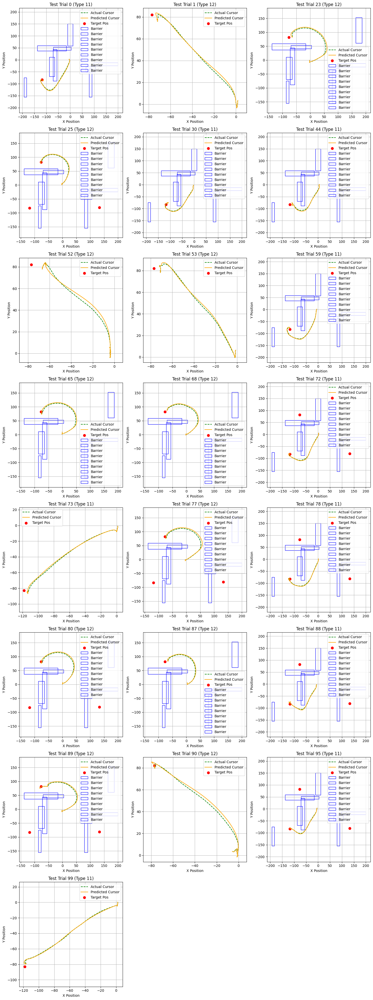

In [30]:
# Set up the grid for plotting
n_cols = 3  # Number of columns in the grid
n_rows = (len(test_data) + n_cols - 1) // n_cols  # Number of rows needed
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()

# Plot actual and predicted trajectories for test trials
for i, trial in enumerate(test_data):
    # Extract actual and predicted cursor positions
    actual_cursor = np.array(trial["cursor_pos"])
    predicted_cursor = predicted_test_trajectories[i]

    ax = axes[i]  # Select subplot axis

    # Plot actual cursor trajectory
    if actual_cursor.size > 0:
        ax.plot(actual_cursor[:, 0], actual_cursor[:, 1], label="Actual Cursor", linestyle="--", color="green")

    # Plot predicted cursor trajectory
    if predicted_cursor.size > 0:
        ax.plot(predicted_cursor[:, 0], predicted_cursor[:, 1], label="Predicted Cursor", color="orange")

    # Plot target positions
    target_pos = np.array(trial["target_pos"])
    if target_pos.size > 0:
        ax.scatter(target_pos[:, 0], target_pos[:, 1], color="red", label="Target Pos", s=50)

    # Plot barriers
    barrier_pos = np.array(trial["barrier_pos"])
    if barrier_pos.size > 0:
        for barrier in barrier_pos:
            # Assuming barrier is represented as [x_center, y_center, half_width, half_height]
            x, y, half_width, half_height = barrier
            rect = patches.Rectangle(
                (x - half_width, y - half_height),  # Bottom-left corner
                2 * half_width,  # Width
                2 * half_height,  # Height
                linewidth=1,
                edgecolor="blue",
                facecolor="none",
                label="Barrier"
            )
            ax.add_patch(rect)

    # Add plot labels and title
    ax.set_title(f"Test Trial {trial['trial_id']} (Type {trial['trial_type']})")
    ax.set_xlabel("X Position")
    ax.set_ylabel("Y Position")
    ax.legend()
    ax.grid(True)
    ax.axis("equal")

# Hide unused subplots
for j in range(len(test_data), len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.savefig("trained_trial.png", format="png", dpi=300)
plt.show()


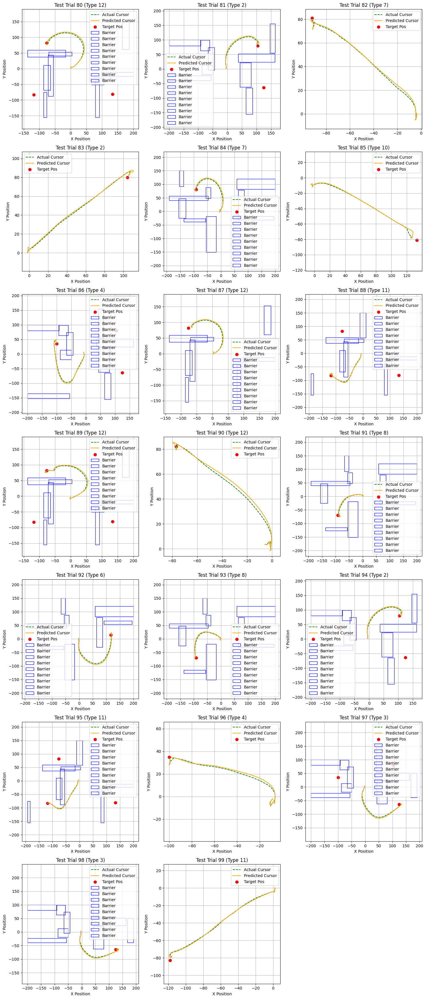

In [32]:
# Split data into training and testing sets based on trial type
test_types = [11, 12]  # Define trial types for test set
train_data = [trial for trial in trial_data if trial["trial_type"] not in test_types]
test_data = [trial for trial in trial_data if trial["trial_type"] in test_types]
train_ids = range(0, int(len(trial_data) * 0.8))  # Use 80% of trials for training
test_ids = range(int(len(trial_data) * 0.8), len(trial_data))  # Use remaining 20% for testing

train_data = [trial for i, trial in enumerate(trial_data) if i in train_ids]
test_data = [trial for i, trial in enumerate(trial_data) if i in test_ids]
# Train the Kalman Filter on the training data
Q, R = train_kalman_filter(train_data)

# Apply Kalman Filter to testing trials
predicted_test_trajectories = []
for trial in test_data:
    cursor_positions = preprocess_trial(trial)
    predicted_cursor = apply_kalman_filter(cursor_positions, Q, R)
    predicted_test_trajectories.append(predicted_cursor)

# Plot actual and predicted trajectories for test trials in a grid layout
n_cols = 3  # Number of columns in the grid
n_rows = (len(test_data) + n_cols - 1) // n_cols  # Calculate number of rows dynamically
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()

# Plot actual and predicted trajectories
for i, trial in enumerate(test_data):
    # Extract actual and predicted cursor positions
    actual_cursor = np.array(trial["cursor_pos"])
    predicted_cursor = predicted_test_trajectories[i]

    ax = axes[i]  # Select subplot axis

    # Plot actual cursor trajectory
    if actual_cursor.size > 0:
        ax.plot(actual_cursor[:, 0], actual_cursor[:, 1], label="Actual Cursor", linestyle="--", color="green")

    # Plot predicted cursor trajectory
    if predicted_cursor.size > 0:
        ax.plot(predicted_cursor[:, 0], predicted_cursor[:, 1], label="Predicted Cursor", color="orange")

    # Plot target positions
    target_pos = np.array(trial["target_pos"])
    if target_pos.size > 0:
        ax.scatter(target_pos[:, 0], target_pos[:, 1], color="red", label="Target Pos", s=50)

    # Plot barriers
    barrier_pos = np.array(trial["barrier_pos"])
    if barrier_pos.size > 0:
        for barrier in barrier_pos:
            # Assuming barrier is represented as [x_center, y_center, half_width, half_height]
            x, y, half_width, half_height = barrier
            rect = patches.Rectangle(
                (x - half_width, y - half_height),  # Bottom-left corner
                2 * half_width,  # Width
                2 * half_height,  # Height
                linewidth=1,
                edgecolor="blue",
                facecolor="none",
                label="Barrier"
            )
            ax.add_patch(rect)

    # Add plot labels and title
    ax.set_title(f"Test Trial {trial['trial_id']} (Type {trial['trial_type']})")
    ax.set_xlabel("X Position")
    ax.set_ylabel("Y Position")
    ax.legend()
    ax.grid(True)
    ax.axis("equal")

# Hide unused subplots
for j in range(len(test_data), len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.savefig("test_trials_trial id.png")
plt.tight_layout()
plt.show()


accuracy

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# Initialize lists to store metrics for all test trials
mse_list = []
rmse_list = []
mae_list = []
r2_list = []

# Evaluate each test trial
for i, trial in enumerate(test_data):
    # Extract actual and predicted cursor positions
    actual_cursor = np.array(trial["cursor_pos"])
    predicted_cursor = predicted_test_trajectories[i]

    # Ensure the shapes are compatible
    if actual_cursor.shape != predicted_cursor.shape or actual_cursor.size == 0 or predicted_cursor.size == 0:
        print(f"Skipping trial {trial['trial_id']} due to mismatched or empty data.")
        continue

    # Compute metrics
    mse = mean_squared_error(actual_cursor, predicted_cursor)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(actual_cursor, predicted_cursor)
    r2 = r2_score(actual_cursor, predicted_cursor)

    # Append metrics to the lists
    mse_list.append(mse)
    rmse_list.append(rmse)
    mae_list.append(mae)
    r2_list.append(r2)

    # Print metrics for each trial
    print(f"Trial {trial['trial_id']} (Type {trial['trial_type']}):")
    print(f"  MSE: {mse:.4f}")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE: {mae:.4f}")
    print(f"  R² Score: {r2:.4f}")

# Aggregate metrics over all test trials
avg_mse = np.mean(mse_list) if mse_list else float("nan")
avg_rmse = np.mean(rmse_list) if rmse_list else float("nan")
avg_mae = np.mean(mae_list) if mae_list else float("nan")
avg_r2 = np.mean(r2_list) if r2_list else float("nan")

# Print overall metrics
print("\nOverall Metrics for Test Data:")
print(f"Average MSE: {avg_mse:.4f}")
print(f"Average RMSE: {avg_rmse:.4f}")
print(f"Average MAE: {avg_mae:.4f}")
print(f"Average R² Score: {avg_r2:.4f}")


Trial 0 (Type 11):
  MSE: 0.0001
  RMSE: 0.0095
  MAE: 0.0061
  R² Score: 1.0000
Trial 1 (Type 12):
  MSE: 0.0001
  RMSE: 0.0081
  MAE: 0.0052
  R² Score: 1.0000
Trial 23 (Type 12):
  MSE: 0.0001
  RMSE: 0.0104
  MAE: 0.0060
  R² Score: 1.0000
Trial 25 (Type 12):
  MSE: 0.0001
  RMSE: 0.0075
  MAE: 0.0043
  R² Score: 1.0000
Trial 30 (Type 11):
  MSE: 0.0001
  RMSE: 0.0087
  MAE: 0.0060
  R² Score: 1.0000
Trial 44 (Type 11):
  MSE: 0.0001
  RMSE: 0.0096
  MAE: 0.0065
  R² Score: 1.0000
Trial 52 (Type 12):
  MSE: 0.0001
  RMSE: 0.0087
  MAE: 0.0058
  R² Score: 1.0000
Trial 53 (Type 12):
  MSE: 0.0001
  RMSE: 0.0075
  MAE: 0.0048
  R² Score: 1.0000
Trial 59 (Type 11):
  MSE: 0.0001
  RMSE: 0.0079
  MAE: 0.0052
  R² Score: 1.0000
Trial 65 (Type 12):
  MSE: 0.0001
  RMSE: 0.0090
  MAE: 0.0054
  R² Score: 1.0000
Trial 68 (Type 12):
  MSE: 0.0001
  RMSE: 0.0085
  MAE: 0.0052
  R² Score: 1.0000
Trial 72 (Type 11):
  MSE: 0.0001
  RMSE: 0.0087
  MAE: 0.0054
  R² Score: 1.0000
Trial 73 (Type 11)

**HMM yayy**

In [ ]:
import numpy as np

def preprocess_trial_for_cnn(trial, time_steps=50, num_neurons=50):
    """Preprocess a trial to align cursor positions and spike data."""
    cursor_positions = np.array(trial["cursor_pos"])  # Shape (T, 2)
    spike_data = trial["spike_data"]  # List of spike timestamps for each neuron

    # Ensure `cursor_positions` has `time_steps`
    cursor_positions_padded = np.zeros((time_steps, 2))  # Padding with zeros
    num_cursor_steps = min(len(cursor_positions), time_steps)
    cursor_positions_padded[:num_cursor_steps] = cursor_positions[:num_cursor_steps]

    # Ensure `spike_data` has fixed bins and neurons
    binned_spike_data = np.zeros((time_steps, num_neurons))  # Shape (time_steps, num_neurons)
    for neuron_idx, spikes in enumerate(spike_data):
        if neuron_idx >= num_neurons:
            break  # Limit to `num_neurons`

        # Bin spike data within the trial duration
        num_bins = min(len(cursor_positions), time_steps)  # Align with time steps
        binned_spikes, _ = np.histogram(
            spikes, bins=np.linspace(0, trial["stop_time"], num_bins + 1)
        )
        binned_spike_data[:num_bins, neuron_idx] = binned_spikes[:num_bins]

    return binned_spike_data, cursor_positions_padded


In [ ]:
pip install elephant


In [ ]:
pip install neo


In [ ]:
pip install pykalman


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 251.6/251.6 kB 4.8 MB/s eta 0:00:00


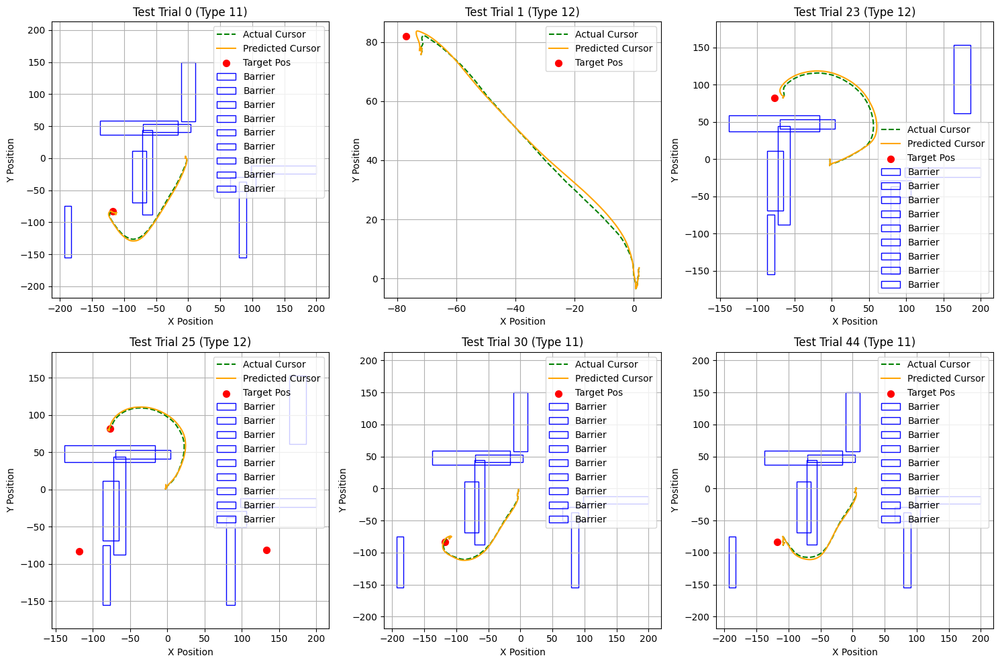

In [ ]:
# Set up the grid for plotting
n_cols = 3  # Number of columns in the grid
n_rows = 2  # Only need 2 rows to accommodate 6 plots (3 columns per row)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 10))  # Adjust height for 2 rows
axes = axes.flatten()

# Plot actual and predicted trajectories for the first 6 test trials
for i, trial in enumerate(test_data[:6]):  # Slice the first 6 trials
    # Extract actual and predicted cursor positions
    actual_cursor = np.array(trial["cursor_pos"])
    predicted_cursor = predicted_test_trajectories[i]

    ax = axes[i]  # Select subplot axis

    # Plot actual cursor trajectory
    if actual_cursor.size > 0:
        ax.plot(actual_cursor[:, 0], actual_cursor[:, 1], label="Actual Cursor", linestyle="--", color="green")

    # Plot predicted cursor trajectory
    if predicted_cursor.size > 0:
        ax.plot(predicted_cursor[:, 0], predicted_cursor[:, 1], label="Predicted Cursor", color="orange")

    # Plot target positions
    target_pos = np.array(trial["target_pos"])
    if target_pos.size > 0:
        ax.scatter(target_pos[:, 0], target_pos[:, 1], color="red", label="Target Pos", s=50)

    # Plot barriers
    barrier_pos = np.array(trial["barrier_pos"])
    if barrier_pos.size > 0:
        for barrier in barrier_pos:
            # Assuming barrier is represented as [x_center, y_center, half_width, half_height]
            x, y, half_width, half_height = barrier
            rect = patches.Rectangle(
                (x - half_width, y - half_height),  # Bottom-left corner
                2 * half_width,  # Width
                2 * half_height,  # Height
                linewidth=1,
                edgecolor="blue",
                facecolor="none",
                label="Barrier"
            )
            ax.add_patch(rect)

    # Add plot labels and title
    ax.set_title(f"Test Trial {trial['trial_id']} (Type {trial['trial_type']})")
    ax.set_xlabel("X Position")
    ax.set_ylabel("Y Position")
    ax.legend()
    ax.grid(True)
    ax.axis("equal")

# Hide unused subplots
for j in range(6, len(axes)):  # Hide plots beyond the first 6
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.savefig("sample_plot_first_6.png", format="png", dpi=300)
plt.show()


In [ ]:
from rich import print_json

# with open("file.json", "r") as file:
#     data = file.read()

# Display JSON in a rich, hierarchical view
print_json(data)


Buffered data was truncated after reaching the output size limit.

In [ ]:
def preprocess_trial(trial, bin_size=0.05):
    """Preprocess a single trial, binning spike data and aligning cursor positions."""
    cursor_positions = np.array(trial["cursor_pos"])  # Shape (T, 2)
    spike_data = trial["spike_data"]                  # List of lists with spike timestamps

    # Calculate the number of bins
    num_bins = int((trial["stop_time"] - trial["start_time"]) / bin_size)

    # Preprocess spike data into fixed bins
    spike_features = np.zeros((len(spike_data), num_bins))  # Shape (num_neurons, num_bins)
    for neuron_idx, spikes in enumerate(spike_data):
        binned_spikes, _ = np.histogram(spikes, bins=np.linspace(0, trial["stop_time"], num_bins + 1))
        spike_features[neuron_idx, :] = binned_spikes

    # Combine spike features across neurons
    spike_summary = np.sum(spike_features, axis=0)  # Shape (num_bins,)

    # Truncate cursor positions to align with the number of bins
    cursor_positions = cursor_positions[:num_bins]

    return cursor_positions, spike_summary

# Adjust the Kalman Filter functions to use binned spike data

def train_kalman_filter(train_data, bin_size=0.05):
    """Train Kalman Filter using training data to estimate noise covariances."""
    all_deltas = []  # To collect state transitions
    all_spike_features = []  # To collect spike data

    for trial in train_data:
        cursor_positions, spike_summary = preprocess_trial(trial, bin_size)
        if cursor_positions.shape[0] < 2:
            continue  # Skip if there's not enough data

        # Calculate position differences (dx, dy) as velocity
        deltas = np.diff(cursor_positions, axis=0)
        velocities = np.hstack([deltas, deltas])  # Simulate [vx, vy] with deltas
        all_deltas.append(velocities)
        all_spike_features.append(spike_summary[:-1])  # Spike features aligned with deltas

    # Combine all deltas and spike features
    all_deltas = np.vstack(all_deltas)
    all_spike_features = np.concatenate(all_spike_features)

    # Create a 5x5 process noise covariance matrix (Q)
    process_noise_cov = np.eye(5) * np.var(all_deltas)

    # Measurement noise covariance (R) can be estimated as the variance of observed positions and spikes
    all_positions = np.vstack([preprocess_trial(trial, bin_size)[0] for trial in train_data if len(trial["cursor_pos"]) > 0])
    measurement_noise_cov = np.diag([np.var(all_positions[:, 0]), np.var(all_positions[:, 1]), np.var(all_spike_features)])

    return process_noise_cov, measurement_noise_cov

def apply_kalman_filter(cursor_positions, spike_summary, Q, R):
    """Apply Kalman Filter to predict the entire cursor trajectory using spike data."""
    if cursor_positions.size == 0 or spike_summary.size == 0:
        return np.array([])

    # Define Kalman Filter with 5 state variables (x, y, vx, vy, spike) and 3 measurements (x, y, spike)
    kf = KalmanFilter(dim_x=5, dim_z=3)

    # Define the state transition matrix (F) and measurement matrix (H)
    kf.F = np.array([
        [1, 0, 1, 0, 0],  # x_t = x_(t-1) + vx_(t-1)
        [0, 1, 0, 1, 0],  # y_t = y_(t-1) + vy_(t-1)
        [0, 0, 1, 0, 0],  # vx_t = vx_(t-1)
        [0, 0, 0, 1, 0],  # vy_t = vy_(t-1)
        [0, 0, 0, 0, 1],  # spike_t = spike_(t-1)
    ])
    kf.H = np.array([
        [1, 0, 0, 0, 0],  # Measure x
        [0, 1, 0, 0, 0],  # Measure y
        [0, 0, 0, 0, 1],  # Measure spike summary
    ])

    # Covariances
    kf.P = np.eye(5) * 1000  # Initial uncertainty
    kf.Q = Q  # Process noise covariance (5x5 matrix)
    kf.R = R  # Measurement noise covariance (3x3 matrix)

    # Initialize the state vector [x, y, vx, vy, spike]
    kf.x = np.array([cursor_positions[0, 0], cursor_positions[0, 1], 0, 0, spike_summary[0]])

    filtered_positions = []  # To store the full predicted trajectory

    for position, spike in zip(cursor_positions, spike_summary):
        kf.predict()  # Predict the next state
        kf.update([position[0], position[1], spike])  # Update with measurements
        filtered_positions.append(kf.x[:2])  # Append only the predicted position [x, y]

    return np.array(filtered_positions)

# # Train the Kalman Filter on the training data
# Q, R = train_kalman_filter(train_data)

# # Apply Kalman Filter to testing trials
# predicted_test_trajectories = []
# for trial in test_data:
#     cursor_positions, spike_summary = preprocess_trial(trial)
#     predicted_cursor = apply_kalman_filter(cursor_positions, spike_summary, Q, R)
#     predicted_test_trajectories.append(predicted_cursor)

# Plot results as before...


In [ ]:
from matplotlib import patches

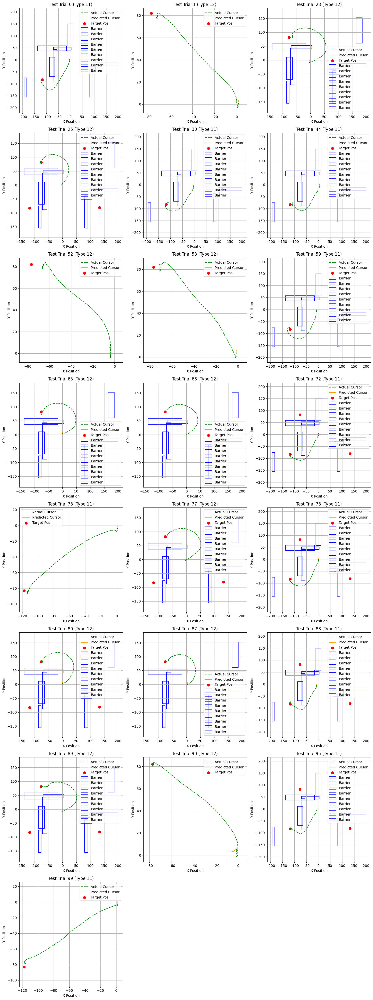

In [ ]:
# Split data into training and testing sets based on trial type
test_types = [11, 12]  # Define trial types for test set
train_data = [trial for trial in trial_data if trial["trial_type"] not in test_types]
test_data = [trial for trial in trial_data if trial["trial_type"] in test_types]

# Train the Kalman Filter on the training data
Q, R = train_kalman_filter(train_data)

# Apply Kalman Filter to testing trials
predicted_test_trajectories = []
for trial in test_data:
    cursor_positions, spike_summary = preprocess_trial(trial)  # Extract both cursor positions and spike data
    predicted_cursor = apply_kalman_filter(cursor_positions, spike_summary, Q, R)  # Pass spike_summary as well
    predicted_test_trajectories.append(predicted_cursor)

# Plot actual and predicted trajectories for test trials in a grid layout
n_cols = 3  # Number of columns in the grid
n_rows = (len(test_data) + n_cols - 1) // n_cols  # Calculate number of rows dynamically
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()

# Plot actual and predicted trajectories
for i, trial in enumerate(test_data):
    # Extract actual and predicted cursor positions
    actual_cursor = np.array(trial["cursor_pos"])
    predicted_cursor = predicted_test_trajectories[i]

    ax = axes[i]  # Select subplot axis

    # Plot actual cursor trajectory
    if actual_cursor.size > 0:
        ax.plot(actual_cursor[:, 0], actual_cursor[:, 1], label="Actual Cursor", linestyle="--", color="green")

    # Plot predicted cursor trajectory
    if predicted_cursor.size > 0:
        ax.plot(predicted_cursor[:, 0], predicted_cursor[:, 1], label="Predicted Cursor", color="orange")

    # Plot target positions
    target_pos = np.array(trial["target_pos"])
    if target_pos.size > 0:
        ax.scatter(target_pos[:, 0], target_pos[:, 1], color="red", label="Target Pos", s=50)

    # Plot barriers
    barrier_pos = np.array(trial["barrier_pos"])
    if barrier_pos.size > 0:
        for barrier in barrier_pos:
            # Assuming barrier is represented as [x_center, y_center, half_width, half_height]
            x, y, half_width, half_height = barrier
            rect = patches.Rectangle(
                (x - half_width, y - half_height),  # Bottom-left corner
                2 * half_width,  # Width
                2 * half_height,  # Height
                linewidth=1,
                edgecolor="blue",
                facecolor="none",
                label="Barrier"
            )
            ax.add_patch(rect)

    # Add plot labels and title
    ax.set_title(f"Test Trial {trial['trial_id']} (Type {trial['trial_type']})")
    ax.set_xlabel("X Position")
    ax.set_ylabel("Y Position")
    ax.legend()
    ax.grid(True)
    ax.axis("equal")

# Hide unused subplots
for j in range(len(test_data), len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.savefig("test_trials_grid.png")
plt.tight_layout()
plt.show()


In [ ]:
Q

array([[0.00106705, 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.00106705, 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.00106705, 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.00106705, 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.00106705]])

In [ ]:
R

array([[   9.12205191,    0.        ,    0.        ],
       [   0.        ,   13.64484507,    0.        ],
       [   0.        ,    0.        , 2198.44104467]])

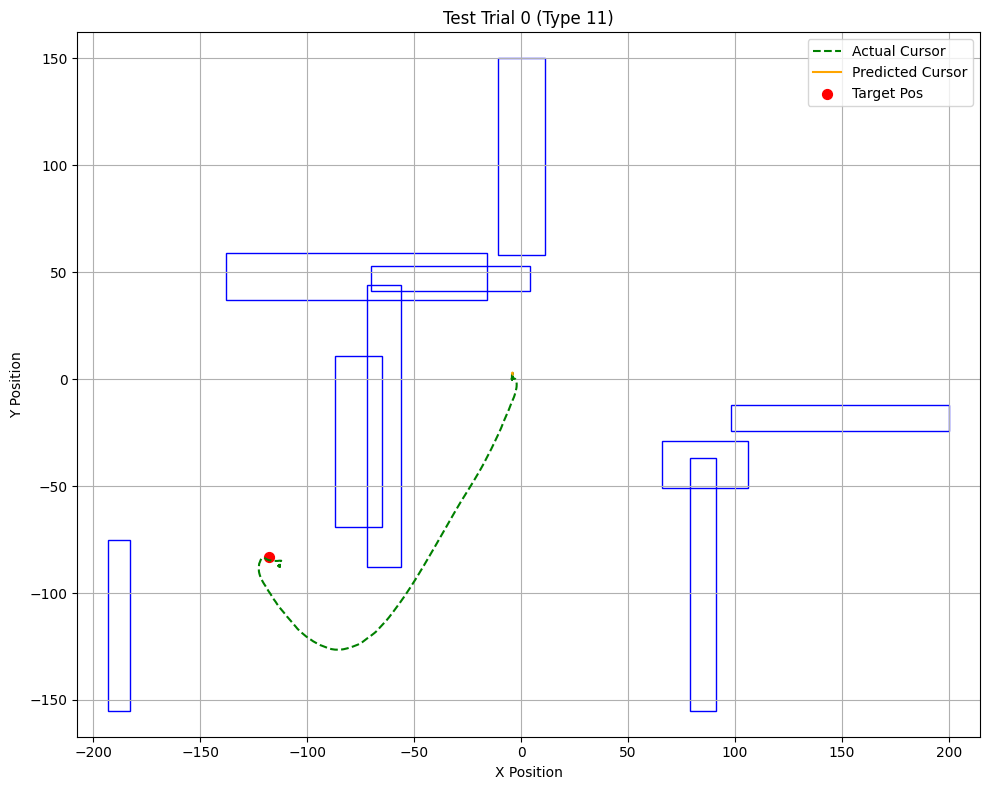

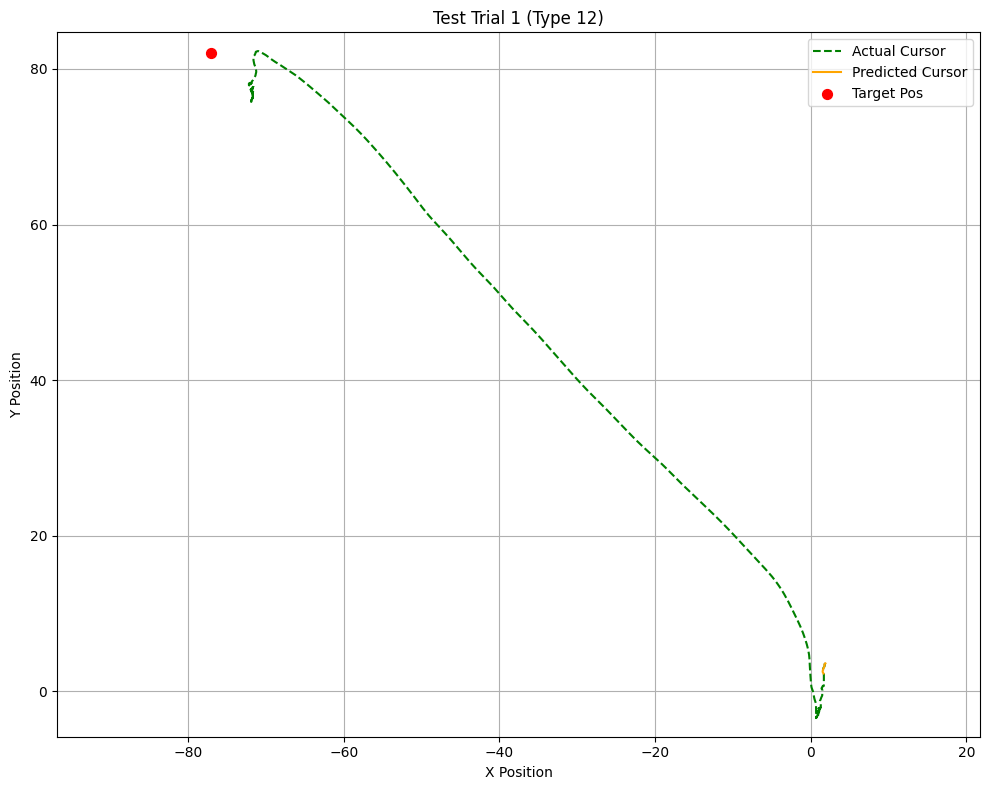

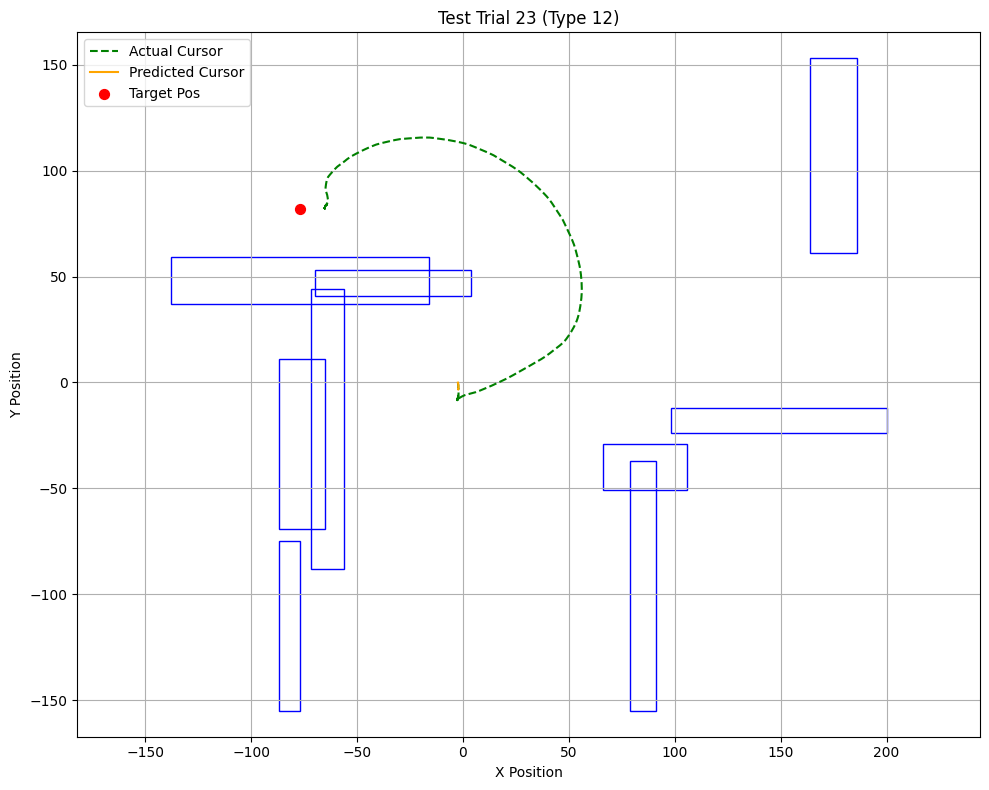

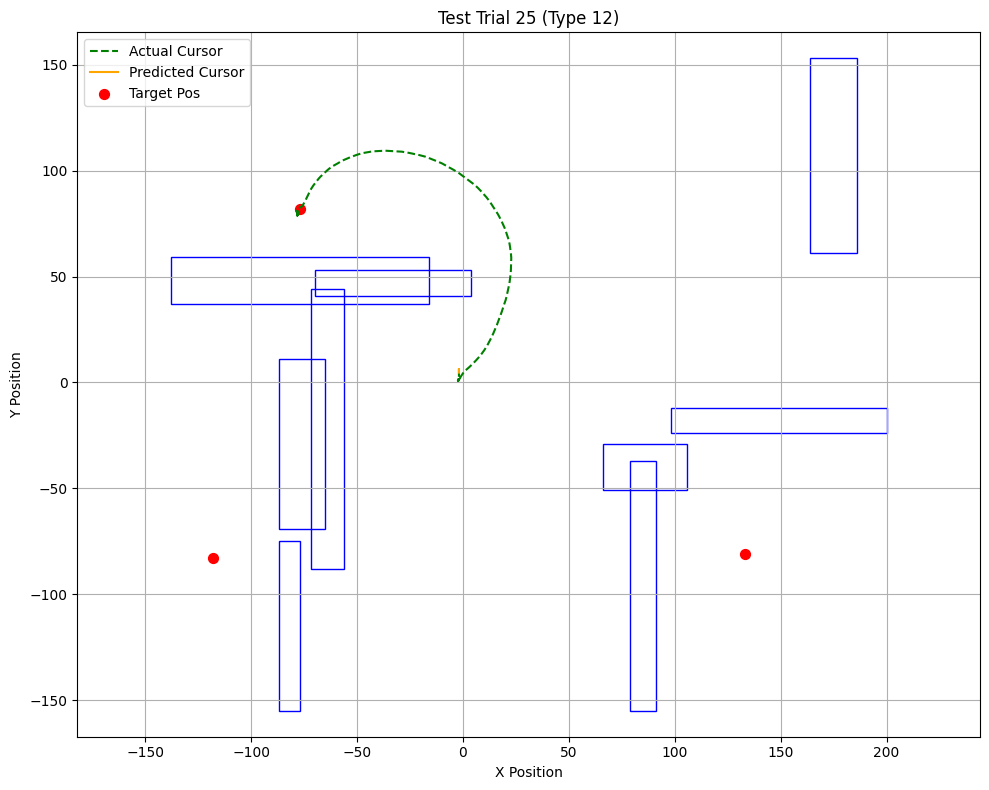

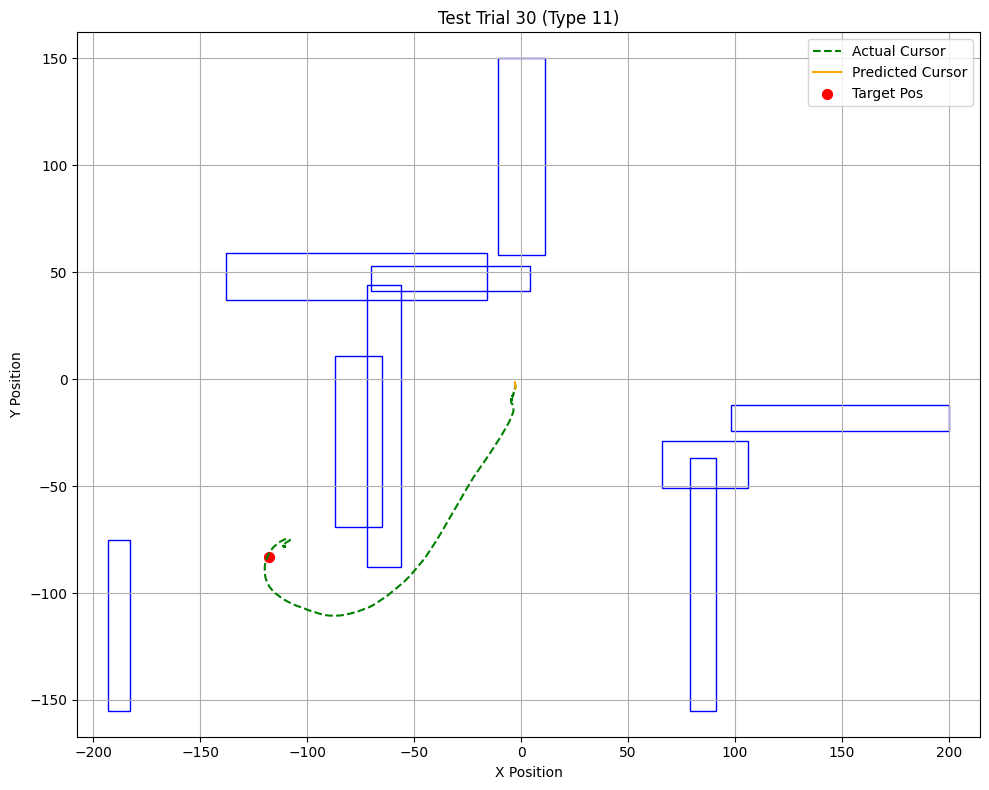

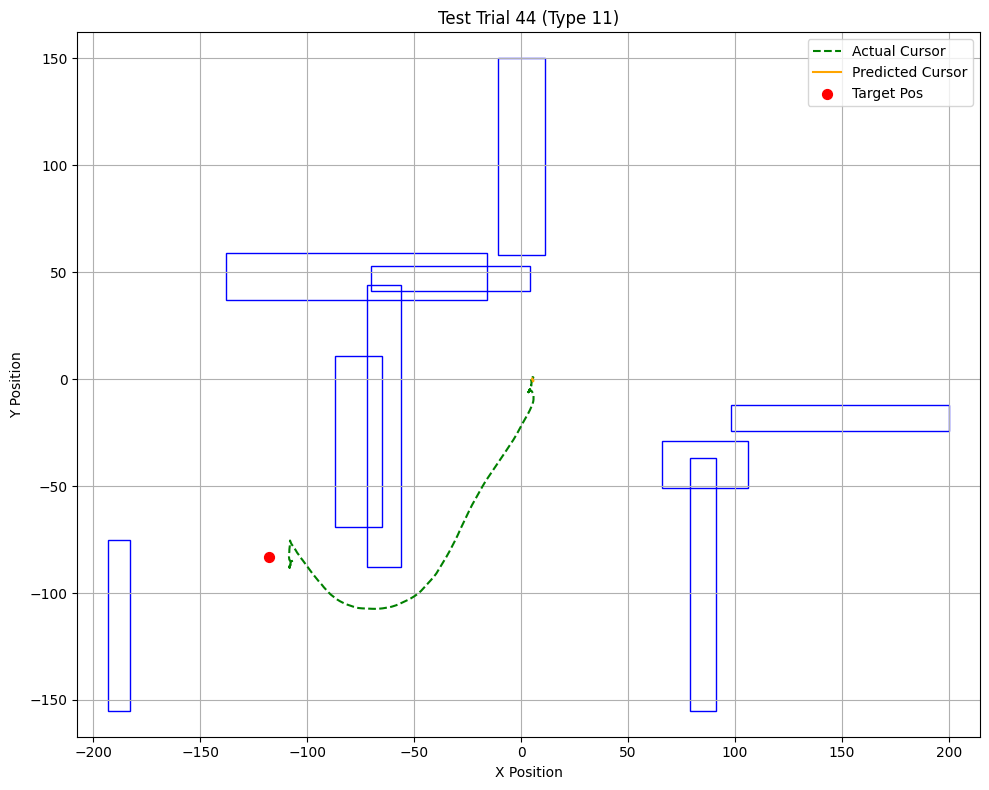

In [ ]:
# Plot only the first 6 test trials
for i, trial in enumerate(test_data[:6]):  # Limit to the first 6 trials
    # Create a new figure for each trial
    plt.figure(figsize=(10, 8))

    # Extract actual and predicted cursor positions
    actual_cursor = np.array(trial["cursor_pos"])
    predicted_cursor = predicted_test_trajectories[i]

    # Plot actual cursor trajectory
    if actual_cursor.size > 0:
        plt.plot(actual_cursor[:, 0], actual_cursor[:, 1], label="Actual Cursor", linestyle="--", color="green")

    # Plot predicted cursor trajectory
    if predicted_cursor.size > 0:
        plt.plot(predicted_cursor[:, 0], predicted_cursor[:, 1], label="Predicted Cursor", color="orange")

    # Plot target positions
    target_pos = np.array(trial["target_pos"])
    if target_pos.size > 0:
        plt.scatter(target_pos[:, 0], target_pos[:, 1], color="red", label="Target Pos", s=50)

    # Plot barriers
    barrier_pos = np.array(trial["barrier_pos"])
    if barrier_pos.size > 0:
        for barrier in barrier_pos:
            # Assuming barrier is represented as [x_center, y_center, half_width, half_height]
            x, y, half_width, half_height = barrier
            rect = patches.Rectangle(
                (x - half_width, y - half_height),  # Bottom-left corner
                2 * half_width,  # Width
                2 * half_height,  # Height
                linewidth=1,
                edgecolor="blue",
                facecolor="none"
            )
            plt.gca().add_patch(rect)

    # Add plot labels and title
    plt.title(f"Test Trial {trial['trial_id']} (Type {trial['trial_type']})")
    plt.xlabel("X Position")
    plt.ylabel("Y Position")
    plt.legend()
    plt.grid(True)
    plt.axis("equal")

    # Save each plot with a unique filename
    plt.tight_layout()
    plt.savefig(f"trial_{trial['trial_id']}_trajectory.png", dpi=300)
    plt.show()


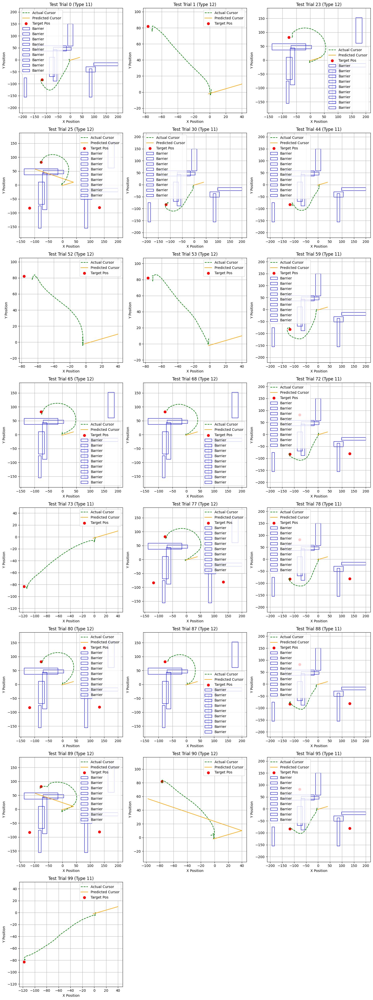

In [ ]:
import numpy as np
from hmmlearn import hmm
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from sklearn.preprocessing import StandardScaler

# Preprocess the data
def preprocess_hmm_data(data):
    """Prepare cursor position data for HMM."""
    all_positions = []
    for trial in data:
        cursor_positions = np.array(trial["cursor_pos"])
        if cursor_positions.size > 0:
            all_positions.append(cursor_positions)
    return all_positions

# Prepare training and testing data
train_cursor_positions = preprocess_hmm_data(train_data)
test_cursor_positions = preprocess_hmm_data(test_data)

# Flatten training data to fit HMM
scaler = StandardScaler()
train_data_flat = np.vstack(train_cursor_positions)
train_data_scaled = scaler.fit_transform(train_data_flat)

# Train HMM model
n_components = 4  # Number of hidden states
hmm_model = hmm.GaussianHMM(n_components=n_components, covariance_type="diag", n_iter=100, random_state=42)
hmm_model.fit(train_data_scaled)

# Predict trajectories for testing data
predicted_test_trajectories = []
for cursor_positions in test_cursor_positions:
    if cursor_positions.size == 0:
        predicted_test_trajectories.append(np.array([]))
        continue

    # Scale the test data using the same scaler
    test_data_scaled = scaler.transform(cursor_positions)

    # Predict hidden states and reconstruct trajectory
    hidden_states = hmm_model.predict(test_data_scaled)
    predicted_cursor = hmm_model.means_[hidden_states]  # Map states to mean positions
    predicted_cursor = scaler.inverse_transform(predicted_cursor)  # Transform back to original scale

    predicted_test_trajectories.append(predicted_cursor)

# Plot actual and predicted trajectories for test trials
n_cols = 3  # Number of columns in the grid
n_rows = (len(test_data) + n_cols - 1) // n_cols  # Calculate number of rows dynamically
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()

# Plot actual and predicted trajectories
for i, trial in enumerate(test_data):
    # Extract actual and predicted cursor positions
    actual_cursor = np.array(trial["cursor_pos"])
    predicted_cursor = predicted_test_trajectories[i]

    ax = axes[i]  # Select subplot axis

    # Plot actual cursor trajectory
    if actual_cursor.size > 0:
        ax.plot(actual_cursor[:, 0], actual_cursor[:, 1], label="Actual Cursor", linestyle="--", color="green")

    # Plot predicted cursor trajectory
    if predicted_cursor.size > 0:
        ax.plot(predicted_cursor[:, 0], predicted_cursor[:, 1], label="Predicted Cursor", color="orange")

    # Plot target positions
    target_pos = np.array(trial["target_pos"])
    if target_pos.size > 0:
        ax.scatter(target_pos[:, 0], target_pos[:, 1], color="red", label="Target Pos", s=50)

    # Plot barriers
    barrier_pos = np.array(trial["barrier_pos"])
    if barrier_pos.size > 0:
        for barrier in barrier_pos:
            # Assuming barrier is represented as [x_center, y_center, half_width, half_height]
            x, y, half_width, half_height = barrier
            rect = patches.Rectangle(
                (x - half_width, y - half_height),  # Bottom-left corner
                2 * half_width,  # Width
                2 * half_height,  # Height
                linewidth=1,
                edgecolor="blue",
                facecolor="none",
                label="Barrier"
            )
            ax.add_patch(rect)

    # Add plot labels and title
    ax.set_title(f"Test Trial {trial['trial_id']} (Type {trial['trial_type']})")
    ax.set_xlabel("X Position")
    ax.set_ylabel("Y Position")
    ax.legend()
    ax.grid(True)
    ax.axis("equal")

# Hide unused subplots
for j in range(len(test_data), len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()


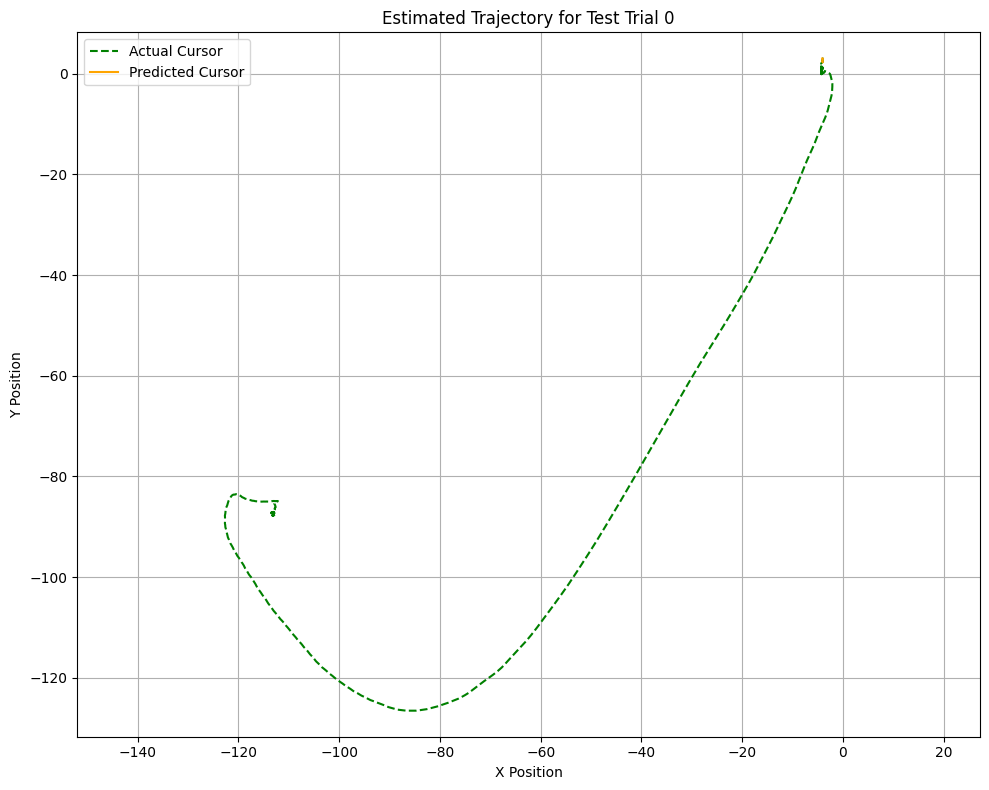

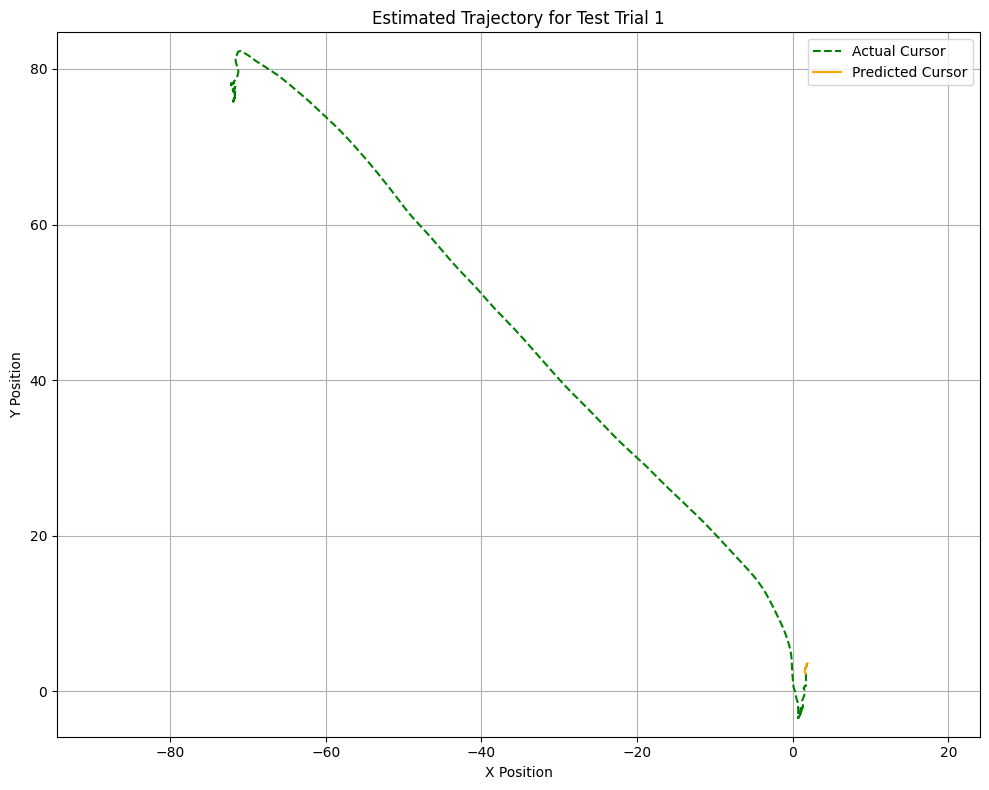

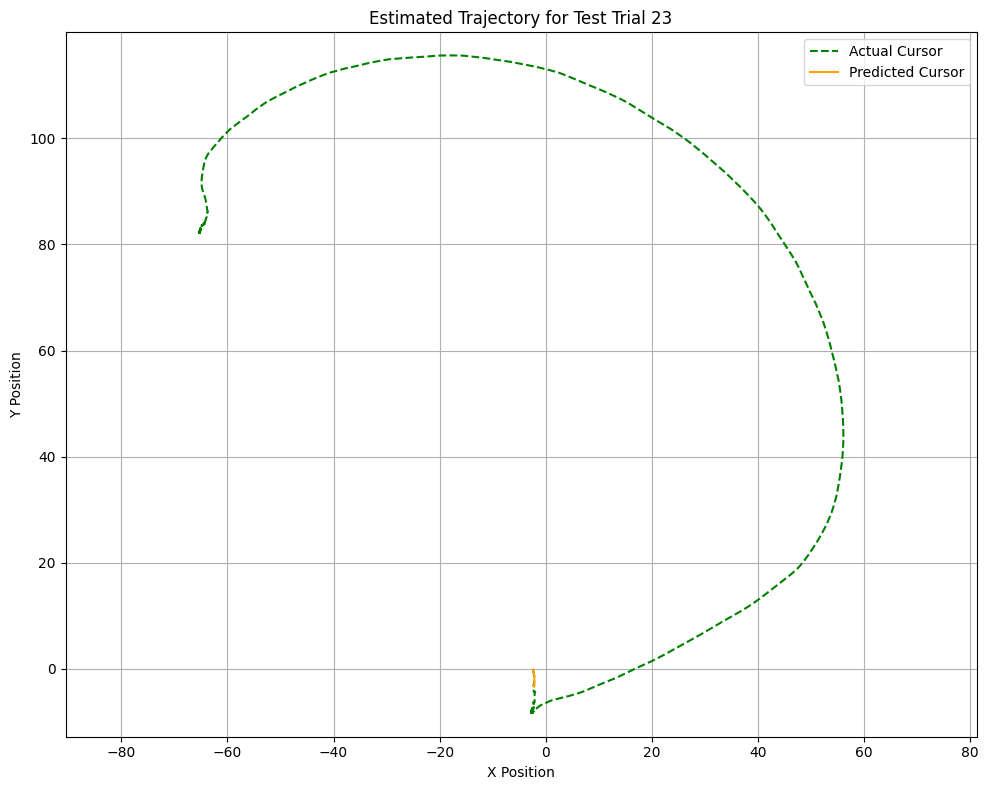

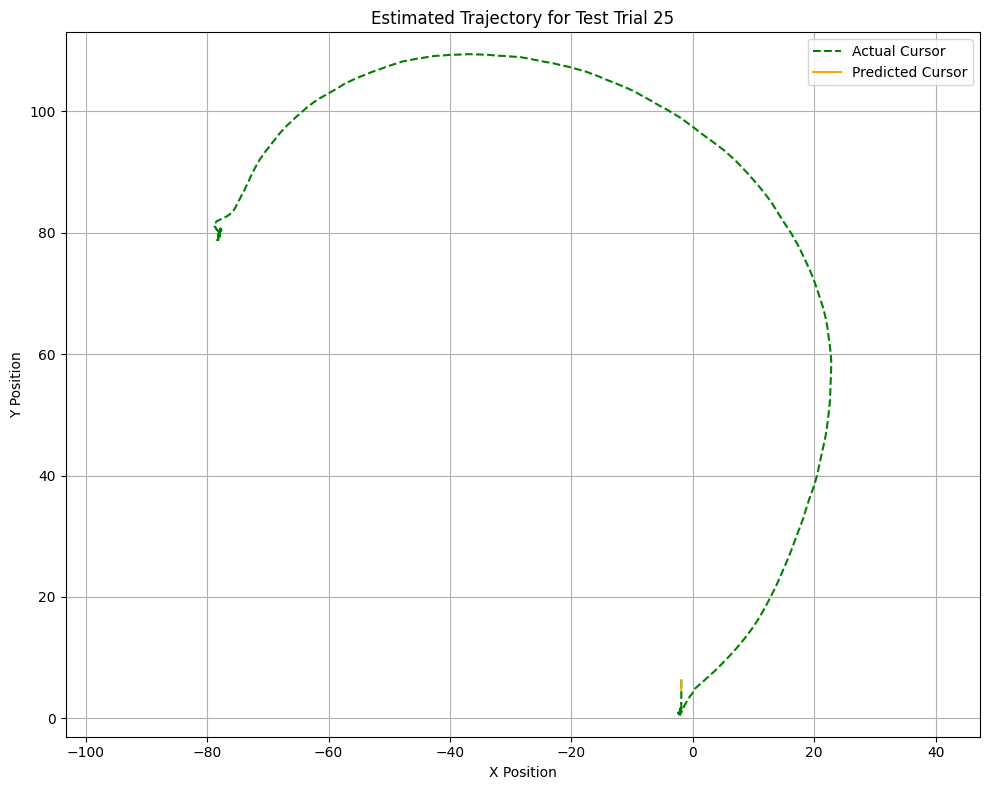

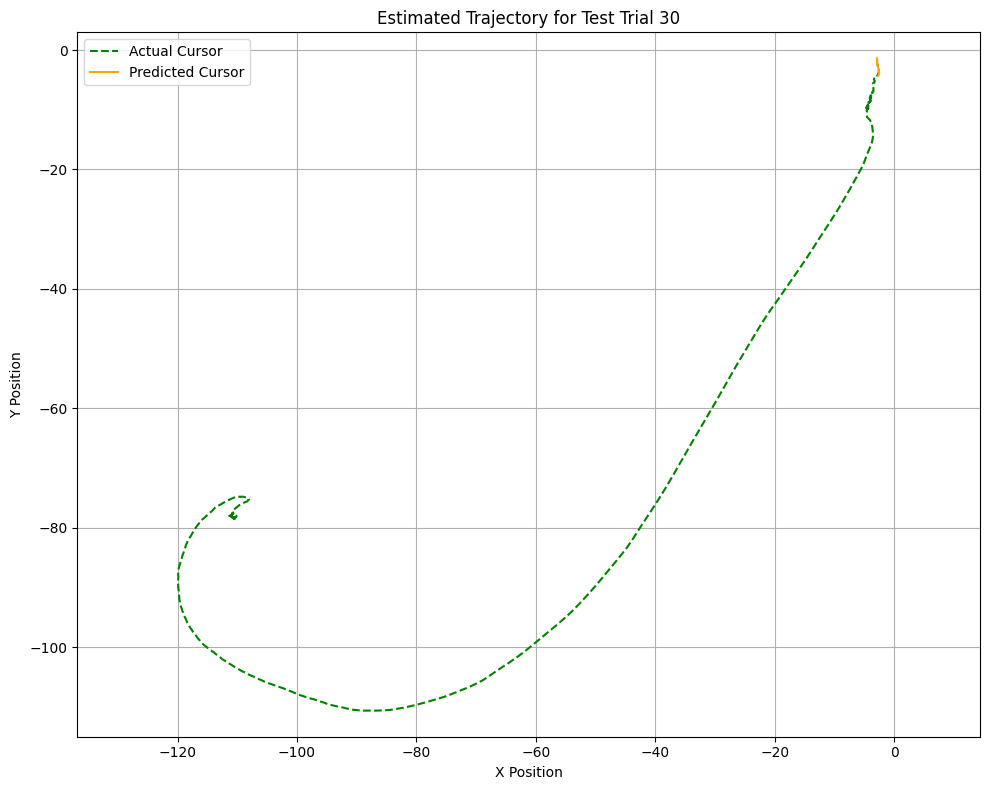

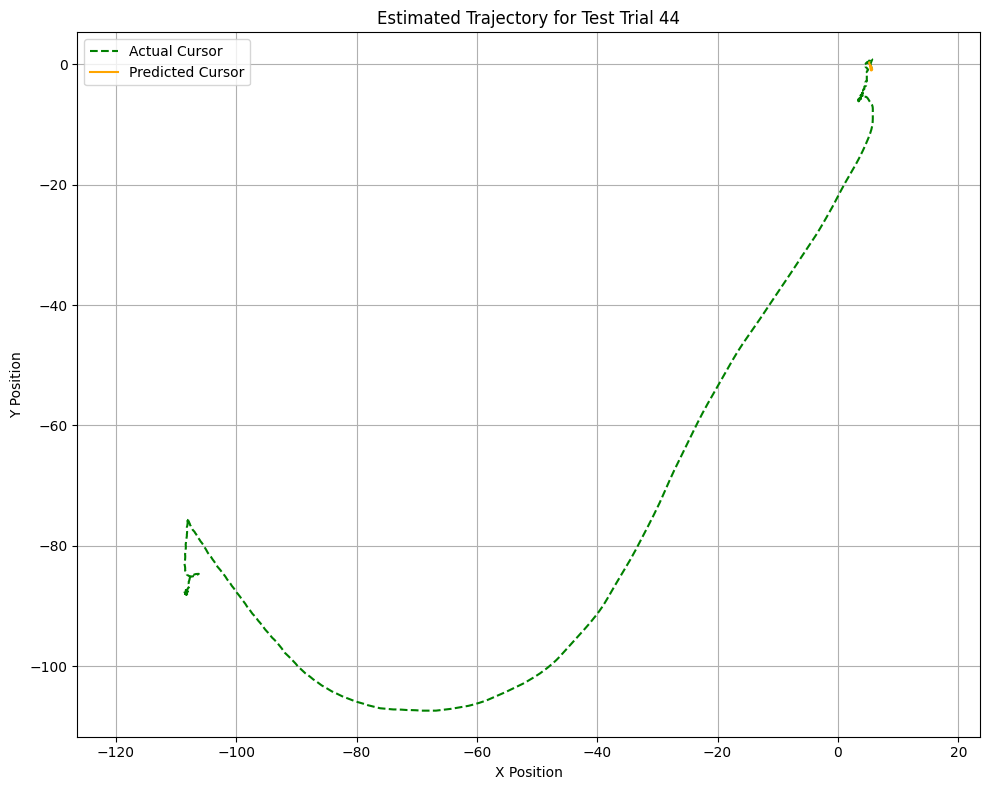

In [ ]:
import numpy as np
from filterpy.kalman import KalmanFilter
import matplotlib.pyplot as plt
from matplotlib import patches

def preprocess_trial(trial, bin_size=0.05):
    """Preprocess a single trial, binning spike data and aligning cursor positions."""
    cursor_positions = np.array(trial["cursor_pos"])  # Shape (T, 2)
    spike_data = trial["spike_data"]                  # List of lists with spike timestamps

    # Calculate the number of bins
    num_bins = int((trial["stop_time"] - trial["start_time"]) / bin_size)

    # Preprocess spike data into fixed bins
    spike_features = np.zeros((len(spike_data), num_bins))  # Shape (num_neurons, num_bins)
    for neuron_idx, spikes in enumerate(spike_data):
        binned_spikes, _ = np.histogram(spikes, bins=np.linspace(0, trial["stop_time"], num_bins + 1))
        spike_features[neuron_idx, :] = binned_spikes

    # Combine spike features across neurons
    spike_summary = np.sum(spike_features, axis=0)  # Shape (num_bins,)

    # Truncate cursor positions to align with the number of bins
    cursor_positions = cursor_positions[:num_bins]

    return cursor_positions, spike_summary

def train_kalman_filter(train_data, bin_size=0.05):
    """Train Kalman Filter using training data to estimate noise covariances."""
    all_deltas = []  # To collect state transitions
    all_spike_features = []  # To collect spike data

    for trial in train_data:
        cursor_positions, spike_summary = preprocess_trial(trial, bin_size)
        if cursor_positions.shape[0] < 2:
            continue  # Skip if there's not enough data

        # Calculate position differences (dx, dy) as velocity
        deltas = np.diff(cursor_positions, axis=0)
        velocities = np.hstack([deltas, deltas])  # Simulate [vx, vy] with deltas
        all_deltas.append(velocities)
        all_spike_features.append(spike_summary[:-1])  # Spike features aligned with deltas

    # Combine all deltas and spike features
    all_deltas = np.vstack(all_deltas)
    all_spike_features = np.concatenate(all_spike_features)

    # Create a 5x5 process noise covariance matrix (Q)
    process_noise_cov = np.eye(5) * np.var(all_deltas)

    # Measurement noise covariance (R) can be estimated as the variance of observed positions and spikes
    all_positions = np.vstack([preprocess_trial(trial, bin_size)[0] for trial in train_data if len(trial["cursor_pos"]) > 0])
    measurement_noise_cov = np.diag([np.var(all_positions[:, 0]), np.var(all_positions[:, 1]), np.var(all_spike_features)])

    return process_noise_cov, measurement_noise_cov

def apply_kalman_filter(cursor_positions, spike_summary, Q, R):
    """Apply Kalman Filter to predict the entire cursor trajectory using spike data."""
    if cursor_positions.size == 0 or spike_summary.size == 0:
        return np.array([])

    # Define Kalman Filter with 5 state variables (x, y, vx, vy, spike) and 3 measurements (x, y, spike)
    kf = KalmanFilter(dim_x=5, dim_z=3)

    # Define the state transition matrix (F) and measurement matrix (H)
    kf.F = np.array([
        [1, 0, 1, 0, 0],  # x_t = x_(t-1) + vx_(t-1)
        [0, 1, 0, 1, 0],  # y_t = y_(t-1) + vy_(t-1)
        [0, 0, 1, 0, 0],  # vx_t = vx_(t-1)
        [0, 0, 0, 1, 0],  # vy_t = vy_(t-1)
        [0, 0, 0, 0, 1],  # spike_t = spike_(t-1)
    ])
    kf.H = np.array([
        [1, 0, 0, 0, 0],  # Measure x
        [0, 1, 0, 0, 0],  # Measure y
        [0, 0, 0, 0, 1],  # Measure spike summary
    ])

    # Covariances
    kf.P = np.eye(5) * 1000  # Initial uncertainty
    kf.Q = Q  # Process noise covariance (5x5 matrix)
    kf.R = R  # Measurement noise covariance (3x3 matrix)

    # Initialize the state vector [x, y, vx, vy, spike]
    kf.x = np.array([cursor_positions[0, 0], cursor_positions[0, 1], 0, 0, spike_summary[0]])

    filtered_positions = []  # To store the full predicted trajectory

    for position, spike in zip(cursor_positions, spike_summary):
        kf.predict()  # Predict the next state
        kf.update([position[0], position[1], spike])  # Update with measurements
        filtered_positions.append(kf.x[:2])  # Append only the predicted position [x, y]

    return np.array(filtered_positions)

def estimate_trajectory(data, Q, R, bin_size=0.05):
    """Estimate the entire trajectory for a given dataset."""
    all_predicted_trajectories = []  # Store predicted trajectories for all trials

    for trial in data:
        # Preprocess trial data to extract cursor positions and spike summary
        cursor_positions, spike_summary = preprocess_trial(trial, bin_size)

        # Skip trial if there is insufficient data
        if cursor_positions.size == 0 or spike_summary.size == 0:
            all_predicted_trajectories.append(np.array([]))
            continue

        # Apply Kalman Filter to estimate the trajectory
        predicted_trajectory = apply_kalman_filter(cursor_positions, spike_summary, Q, R)
        all_predicted_trajectories.append(predicted_trajectory)

    return all_predicted_trajectories

# Train Kalman Filter
Q, R = train_kalman_filter(train_data, bin_size=0.05)

# Estimate trajectories for test data
predicted_test_trajectories = estimate_trajectory(test_data, Q, R, bin_size=0.05)

# Plot estimated trajectories for the first 6 test trials
for i, trial in enumerate(test_data[:6]):
    actual_cursor = np.array(trial["cursor_pos"])
    predicted_cursor = predicted_test_trajectories[i]

    # Create a new plot for each trial
    plt.figure(figsize=(10, 8))

    # Plot actual trajectory
    if actual_cursor.size > 0:
        plt.plot(actual_cursor[:, 0], actual_cursor[:, 1], label="Actual Cursor", linestyle="--", color="green")

    # Plot predicted trajectory
    if predicted_cursor.size > 0:
        plt.plot(predicted_cursor[:, 0], predicted_cursor[:, 1], label="Predicted Cursor", color="orange")

    # Add plot labels and title
    plt.title(f"Estimated Trajectory for Test Trial {trial['trial_id']}")
    plt.xlabel("X Position")
    plt.ylabel("Y Position")
    plt.legend()
    plt.grid(True)
    plt.axis("equal")
    plt.tight_layout()
    plt.show()


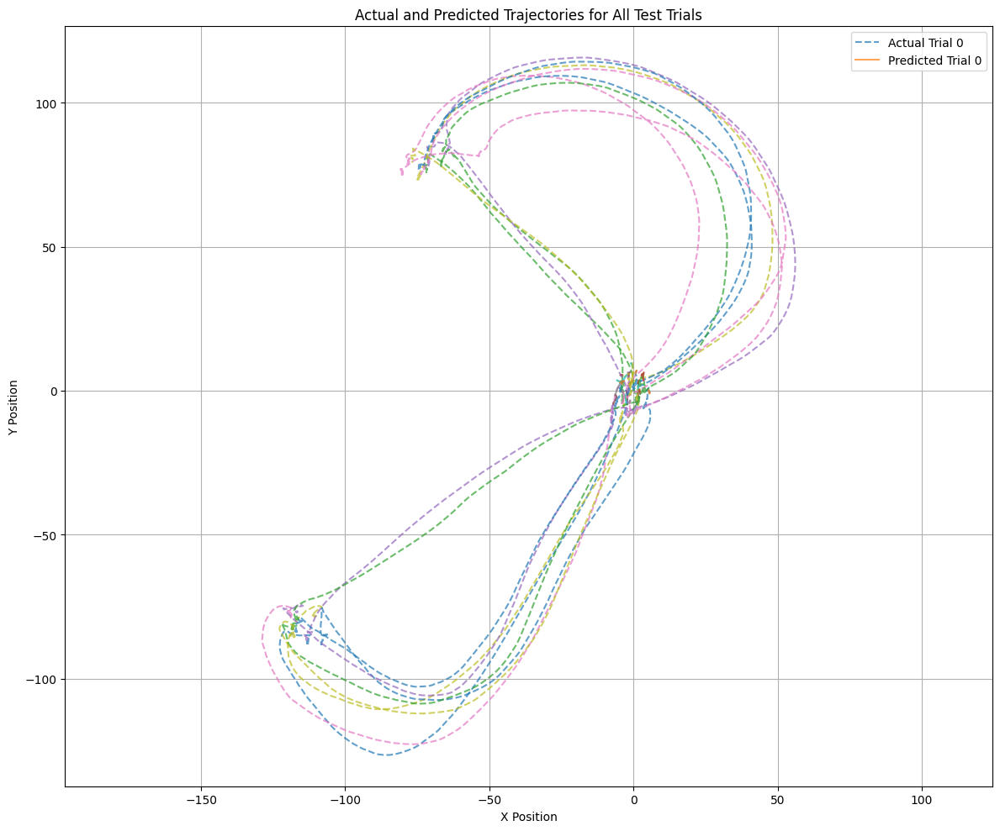

In [ ]:
# Plot all actual and predicted trajectories on a single plot
plt.figure(figsize=(12, 10))

# Loop through all test trials
for i, trial in enumerate(test_data):
    actual_cursor = np.array(trial["cursor_pos"])
    predicted_cursor = predicted_test_trajectories[i]

    # Plot actual trajectory
    if actual_cursor.size > 0:
        plt.plot(actual_cursor[:, 0], actual_cursor[:, 1], linestyle="--", label=f"Actual Trial {trial['trial_id']}" if i < 1 else "", alpha=0.7)

    # Plot predicted trajectory
    if predicted_cursor.size > 0:
        plt.plot(predicted_cursor[:, 0], predicted_cursor[:, 1], label=f"Predicted Trial {trial['trial_id']}" if i < 1 else "", alpha=0.7)

# Add labels and title
plt.title("Actual and Predicted Trajectories for All Test Trials")
plt.xlabel("X Position")
plt.ylabel("Y Position")
plt.legend(loc="upper right")
plt.grid(True)
plt.axis("equal")
plt.tight_layout()
plt.show()
